<img src ='CCT_logo.jpg'/>

## MSc in Data Analytics ##


### Individual Project CA2

Author:

|Student Name | Student Number | Email address |
|:-|:-:|:-:|
| Vitor Notaro | sba20229 | vitornotaro34@gmail.com 

Lecturer:

|Lecturer Name | Module | Email address |
|:-|:-:|:-:|
| David McQuaid | Data Preparation & Visualisation for Data Analytics | dmcquaid@cct.ie |
| David McQuaid | Programming for Data Analytics | dmcquaid@cct.ie |
| Dr. Muhammad Iqbal | Machine Learning for Data Analytics | miqbal@cct.ie |
| Marina Iantorno | Statistics for Data Analytics | miantorno@cct.ie |

##  Initial Exploratory and Data Analysis

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
from dataprep.eda import create_report
import warnings
warnings.filterwarnings('ignore')
warnings.warn('ignore')

An analyses of EU estimated agricultural balance sheets provided by European Commission, Joint Research Centre (JRC) (2018): EU estimated agricultural balance sheets.

***Description***

A simplified balance sheet to estimate apparent consumption of meat, crops and dairy products, olive oil and wine, at Member State level. It combines trade data from Eurostat COMEXT database and DG AGRI's short-term outlook for EU agricultural markets to provide historic data on agricultural production, trade and an estimate of apparent use.

DG AGRI, in the Short-term outlook, prepares regularly EU balance sheets for the main agricultural commodities, as well as production, area and yield figures at Member State level, but an estimate of Member States annual consumption was missing, since Eurostat stopped collecting and publishing balance sheets. This dataset fills partially the gap with a rough estimate of apparent use, without detailing the different uses (food, feed, processing), losses or changes in stocks.

This apparent use cannot be taken at face value as the consumption level, also because the calculation relies on trade statistics between EU Member States which are less reliable than extra-EU trade figures.

Data set available at:  https://data.jrc.ec.europa.eu/dataset/33243e5e-44a1-4b43-9444-31d64dc7921f

In [2]:
# Using Pandas to read the dataset.
df = pd.read_csv("Datasets/Dataset_DG_AGRI-JRC_-_Production__trade_and_apparent_use__EU-27_.csv")
# Using head() to visualize the top 5 rows

In [3]:
# Applying filter to select only observations related to Meat.
df= df[df["Commodity (Type)"]=="MEAT"]
# Excluding observations related to the aggregation of the European continent as Europe is not a Country.
df =df[df['Country']!="EU"]

In [4]:
#Selecting only collumns related to Meat
df = df.loc[:,['Year','Country','Country (NUTS Code)',"Commodity (Type)",'Commodity','Apparent use (THOUSAND TONS (C.W.E.))','Carcass weight (KG/HEAD)','Gross indigenous production (THOUSAND TONS (C.W.E.))','Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Net production (heads) (THOUSAND HEAD)','Net production (tons) (THOUSAND TONS (C.W.E.))']]

As the below details confirmed, this dataset has no missing values for any column.

In [5]:
# This method prints information about a DataFrame including the index dtype and column
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2160 entries, 41 to 28819
Data columns (total 18 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Year                                                  2160 non-null   int64  
 1   Country                                               2160 non-null   object 
 2   Country (NUTS Code)                                   2160 non-null   object 
 3   Commodity (Type)                                      2160 non-null   object 
 4   Commodity                                             2160 non-null   object 
 5   Apparent use (THOUSAND TONS (C.W.E.))                 2160 non-null   float64
 6   Carcass weight (KG/HEAD)                              2155 non-null   float64
 7   Gross indigenous production (THOUSAND TONS (C.W.E.))  2160 non-null   float64
 8   Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))      21

In [6]:
df.reset_index(drop=True).head(5)

,Year,Country,Country (NUTS Code),Commodity (Type),Commodity,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
0,2002,Austria,AT,MEAT,BOVINE,150.230876,299.546142,221.668323,1.519472,11.760207,0.000000,3.471356,16.757085,55.991175,0.102140,11.016996,707.27,211.86
1,2003,Austria,AT,MEAT,BOVINE,147.146140,303.832397,217.864637,2.158318,12.495831,0.000000,4.899512,9.201370,64.825500,0.402660,12.660350,684.95,208.11
2,2004,Austria,AT,MEAT,BOVINE,136.276934,306.036465,214.087118,2.677365,12.945268,0.009130,7.816385,9.631965,73.198990,0.142670,12.675219,674.07,206.29
3,2005,Austria,AT,MEAT,BOVINE,143.325801,311.445341,208.223687,2.583296,14.606232,0.006534,12.719307,5.079205,73.382565,0.111795,17.915776,654.24,203.76
4,2006,Austria,AT,MEAT,BOVINE,149.743905,314.283203,225.468730,3.059186,16.224407,0.010588,8.384275,6.473250,79.464270,0.132870,20.968555,682.76,214.58


## Data Exploration

According to the Irish Department of Agriculture, Food and the Marine overall beef is Ireland’s second most valuable category of agri-export after Dairy. 

In total 38% of beef exports went to EU countries; 46% to the UK, the remaining 16% to 3rd Country (Non-EU) markets.

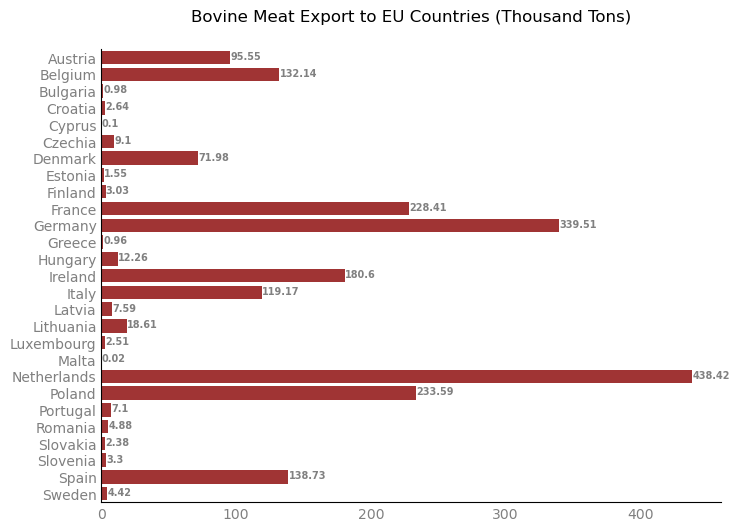

In [7]:
# Applying filter to select only observations related to Bovine.
bovine = df[df["Commodity"]=="BOVINE"]
plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':100})
sns.barplot(x="Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))",
            y='Country',data=bovine,color="firebrick",ci=None)

from matplotlib import rcParams
ax= plt.gca()
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 7, fontweight ='bold',
             color ='grey')
ax.set_title("Bovine Meat Export to EU Countries (Thousand Tons)", pad=20)
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

The Above chart suggest Ireland as a 5th biggest export for EU Countries.

When comparing EU exports for NON EU Countries Ireland comes out first in absolute terms.

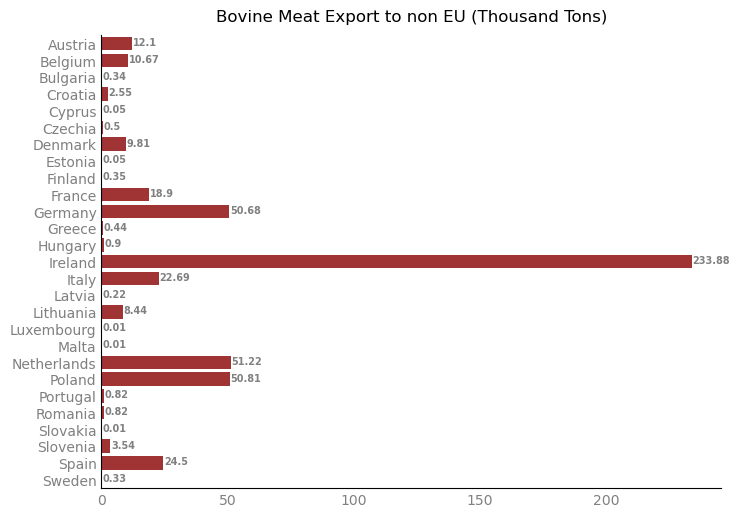

In [8]:
# Applying filter to select only observations related to Meat.
bovine = df[df["Commodity"]=="BOVINE"]
sns.barplot(x="Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))",
            y='Country',data=bovine,color='firebrick',ci=None)
ax= plt.gca()
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 7, fontweight ='bold',
             color ='grey')
ax.set_title('Bovine Meat Export to non EU (Thousand Tons)', pad=10)
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

According to the Irish Department of Agriculture, Food and the Marine at present Irish meat is exported to around 70 countries around the world, both within the European Union on general commercial documents and outside the European Union, either on the basis of bilaterally agreed veterinary health certificates, EU health certificates or on general meat certificates.

However the exported meat products are not limited to beef as they also include: Beef , Pig meat, Sheep meat, Poultry and Cooked meats, making Ireland an important player in a global context.

With a relatively small geographic area when comparing with other Countries such as Spain, France, Germany and Poland (without mention other giants outside EU). The "Little Green Island" might surprise some people (like me) by being at the top of this list.

There are many reasons for the Irish performance and many people including farmers, companies and traders, producers, local authorities are responsible for this success. 

In fact like almost everything in life there are no a single and simple explanation to justify such a feat, however, one of the interesting details about this market is that Ireland also appears as the biggest Live imports (Livestock animals).

That <span style="color:red">"100% Irish Meat"</span> advertisement might not be so true. (But it does not matter we still are big fans of Irish Meat)

In [9]:
# reading Country Codes data frame
country_codes = pd.read_csv("Datasets/country_codes.tsv", sep='\t')

In [10]:
# merging to obtain the Alpha 3 code
df = pd.merge(df, country_codes[["Country",'Alpha-3 code']], on="Country", how="left")

In [11]:
# Geo Map
import plotly.express as px
fig = px.choropleth(df.pivot_table(index =['Alpha-3 code','Country'],
                    values =["Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))"],
                    aggfunc ='sum').reset_index(),
                    locations="Alpha-3 code",
                    color="Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))", 
                    # column by which to color-code
                    hover_name="Country", 
                    # column to display in hover information
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.update_layout(
    # add a title text for the plot
    title_text = '',
    geo_scope = 'europe')
fig.show()

As previously mentioned each one of the 27 EU Country members have different Geographical area and obviously that influence in regards to the Farm Structure available on each country.

To fairly compare the countries it will be considered the Farm Structure of each country.

Using the European Comparison Table provided by Eurostat where it can be founded details about holdings and agricultural area size in the EU Member States.

Availabel at( https://ec.europa.eu/eurostat/statistics-explained/index.php?title=Archive:Farm_structure_survey_2013_-_main_results)

Unsupervised Machine Learning Models will be applied in order to cluster the Countries based on their Farm Structure.

Unsupervised learning is a type of Machine Learning algorithm that learns patterns from untagged data. 

The goal of the algorithm is to find relationships within the data and group data points based on the input data.

For this exercise Hierarchical Cluster and KMeans are the selected models once both works based on Euclidean Distance.

Visualizing the first 5 rows.

In [12]:
# Using Pandas to read Comparison Farm Structure dataset.
df1 = pd.read_csv("Datasets/European Comparison-Farm Structure Survey 2013.csv")
# Using head() to visualize the top 5 rows
df1.head(6).iloc[1:]

,Country,Number of holdings (000),Utilised agricultural area (000 hectares),Average area per holding (hectares)
1,Belgium,37.8,"1,307.90",34.6
2,Bulgaria,254.4,"4,650.90",18.3
3,Czech Republic,26.3,"3,491.50",133.0
4,Denmark,38.8,"2,619.30",67.5
5,Germany,285,"16,699.60",58.6


In [13]:
# Removing EU row
df1=df1[df1['Country']!="EU"]

In [14]:
# Replace comma using a Lambda function
df1['Number of holdings (000)'] = df1['Number of holdings (000)'].apply(lambda field: field.replace(",", ""))

In [15]:
# Replace comma using a Lambda function
df1['Utilised agricultural area (000 hectares)'] = df1['Utilised agricultural area (000 hectares)'].apply(lambda field: field.replace(",", ""))

In [16]:
# Reset the index after remove EU row.
df1.reset_index(inplace=True, drop=True)

In [17]:
# Selecting numerical features to applie cluster
df2 = df1[["Average area per holding (hectares)","Utilised agricultural area (000 hectares)","Number of holdings (000)"]]

In [18]:
# Checking Type of each variables
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28 entries, 0 to 27
Data columns (total 3 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Average area per holding (hectares)        28 non-null     float64
 1   Utilised agricultural area (000 hectares)  28 non-null     object 
 2   Number of holdings (000)                   28 non-null     object 
dtypes: float64(1), object(2)
memory usage: 800.0+ bytes


In [19]:
# Changing objects into float type
df2['Number of holdings (000)'] = df2['Number of holdings (000)'].astype(float)
df2['Utilised agricultural area (000 hectares)'] = df2['Utilised agricultural area (000 hectares)'].astype(float)

As we have different scales of values on this dataset and it is know that many machine learning algorithms require data scaling to produce good results.

Data Scaling will be applied using StandartScaler to standardize the features onto unit scale (mean = 0 and standard deviation = 1)

In [20]:
# Use StandardScaler from Scikit Learn to standardize the features onto unit scale (mean = 0 and standard deviation = 1) 
from sklearn.preprocessing import StandardScaler
data_scaled = StandardScaler().fit_transform(df2)

## Clustering 

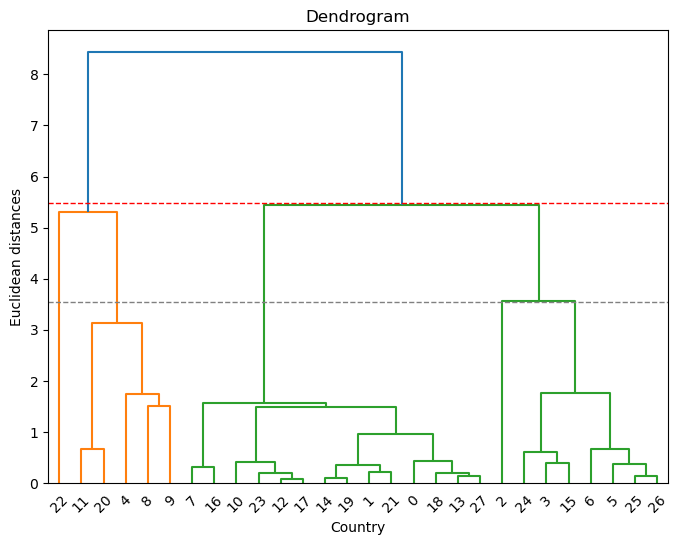

In [21]:
# Using hierarchy to cluster the observations
#Importing scipy.cluster.hierarchy to create dendrogram
import scipy.cluster.hierarchy as sch

dendrogram =sch.dendrogram(sch.linkage(data_scaled,method = 'ward'))

#creating the plot, assigning labels and title
plt.title('Dendrogram')
plt.xlabel('Country')
plt.ylabel('Euclidean distances')

# Add horizontal line to visualize .
plt.axhline(y=3.55, c='grey', lw=1, linestyle='dashed')
plt.axhline(y=5.49, c='red', lw=1, linestyle='dashed')
plt.show()

A dendrogram is used to represent the relationship between objects. 

It is used to display the distance between each pair of sequentially merged objects in a feature space. 

Dendrograms are commonly used in studying the hierarchical clusters before deciding the appropriate number of clusters for a dataset.

The above plot suggests some countries have similar patterns.

A common approach is to analyze the dendrogram and look for groups that combine at a higher dendrogram distance.

The Grey dashed draw line crosses four groups and suggests a distance of 1.9 (from 3.6 to 6.5)

The Red dashed draw line crosses two groups and suggests a distance greater than 3 (from 5.5 to 8.5)

For this reason two cluster is the most appropriate according to the this plot.

However there are other options such as K Means Cluster.

K means also works with Euclidean distances. 

However, differently of Hierarchy, KMeans algorithm requires the number of clusters to be specified.

For that reason I am going to use Elbow method to get insights of the possible number of clusters for parameter K

In [22]:
# Including Cluster Labels
# importing the library 
from sklearn.cluster import AgglomerativeClustering
hierarchy_cluster = AgglomerativeClustering(n_clusters=2, affinity="euclidean", linkage="ward")
#create a pandas series to be used latter on
y1 = pd.Series(hierarchy_cluster.fit_predict(data_scaled), name="Cluster_Hierarchical")

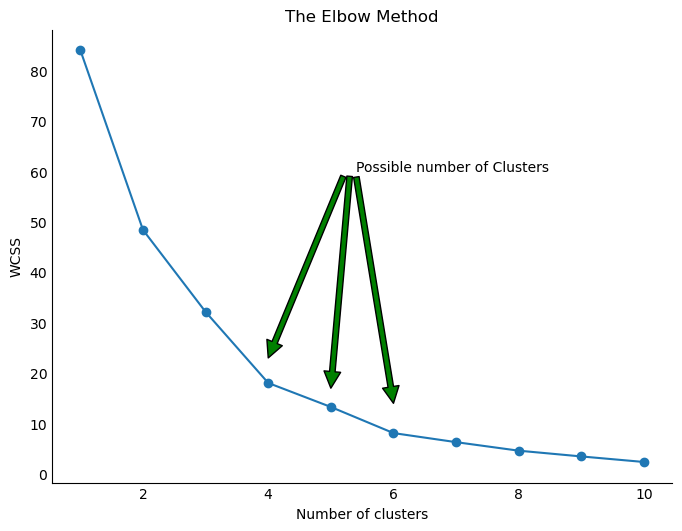

In [23]:
# Plotting Elbow method
#Using the elbow method to find the optimal number of clusters
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11),wcss,marker='o')
plt.title('The Elbow Method')
plt.annotate('Possible number of Clusters', xy=(6, 14), xytext=(5.4, 60), arrowprops=dict(facecolor='green'))
plt.annotate("",xy=(4, 23), xytext=(5.2, 59), arrowprops=dict(facecolor='green'))
plt.annotate("",xy=(5, 17), xytext=(5.3, 59), arrowprops=dict(facecolor='green'))
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
sns.despine()
ax= plt.gca()
ax.tick_params(axis="both", colors="black", length = 0)
plt.show();

From the above plot I can see the line starts to become flat around 4, but could also be 5 or 6

For this reason I am going to test the 3 possible numbers for K and measure the Silhouette score for each number of clusters

In [24]:
#Importing and Fitting K-Means to dataset
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 0)
y2 = pd.Series(kmeans.fit_predict(data_scaled), name="Cluster_KMeans")

## Silhouette Score

Silhouette Coefficient also know as silhouette score is a metric used to calculate the efficiency of a clustering technique.

Its value ranges from -1 to 1.

1: Means clusters are well apart from each other and clearly distinguished.

0: Means clusters are indifferent, or we can say that the distance between clusters is not significant.

-1: Means clusters are assigned in the wrong way.

In [25]:
#importing the library
from sklearn.metrics import silhouette_score

# Calculate Silhouette Score hierarchy
hierarchy_score = silhouette_score(data_scaled, hierarchy_cluster.labels_, metric='euclidean')
# Print the score
print('Silhouette Score Hierarchy for 2 clusters: %.3f' % hierarchy_score)

from sklearn.cluster import KMeans
# Calculate Silhouette Score KMeans
for i in range(4,7):
    
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    y3 = pd.Series(kmeans.fit_predict(data_scaled), name="Cluster KMeans")
    score = silhouette_score(data_scaled, kmeans.labels_, metric='euclidean')
    print("Silhouette Score KMeans for "  + str(i) + " clusters : %.3f" % score)

Silhouette Score Hierarchy for 2 clusters: 0.533
Silhouette Score KMeans for 4 clusters : 0.508
Silhouette Score KMeans for 5 clusters : 0.481
Silhouette Score KMeans for 6 clusters : 0.445


The Silhouette Score test suggests Hierarchy with 2 Cluster as the best option with a higher score 

In [26]:
# assigning the Hierarchy cluster labels for each observation in df2
df2 = pd.concat([df1, y1], axis = 1)

In [27]:
df2

,Country,Number of holdings (000),Utilised agricultural area (000 hectares),Average area per holding (hectares),Cluster_Hierarchical
0,Belgium,37.8,1307.90,34.6,0
1,Bulgaria,254.4,4650.90,18.3,0
2,Czech Republic,26.3,3491.50,133.0,0
3,Denmark,38.8,2619.30,67.5,0
4,Germany,285,16699.60,58.6,1
5,Estonia,19.2,957.5,49.9,0
6,Ireland,139.6,4959.40,35.5,0
7,Greece,709.5,4856.80,6.8,0
8,Spain,965,23300.20,24.1,1
9,France,472.2,27739.40,58.7,1


## Merging the Two

In [28]:
# Merging the two datasets using Country as a key and left as a join 
new_df = pd.merge(df, df2[["Country","Cluster_Hierarchical"]], on="Country", how="left")#.fillna(0)

As previous seen Ireland belongs to the Cluster 0, for that reason Cluster 1 will be ignored for next steps.

In [29]:
# New dataframe with only cluster 3
list_country_0 = new_df[new_df["Cluster_Hierarchical"] == 0]

Selecting interested columns

In [30]:
list_country_0=list_country_0.loc[:,['Year','Country','Commodity','Apparent use (THOUSAND TONS (C.W.E.))','Carcass weight (KG/HEAD)','Gross indigenous production (THOUSAND TONS (C.W.E.))','Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Live imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.))','Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.))','Net production (heads) (THOUSAND HEAD)','Net production (tons) (THOUSAND TONS (C.W.E.))']]

In [31]:
df10= list_country_0

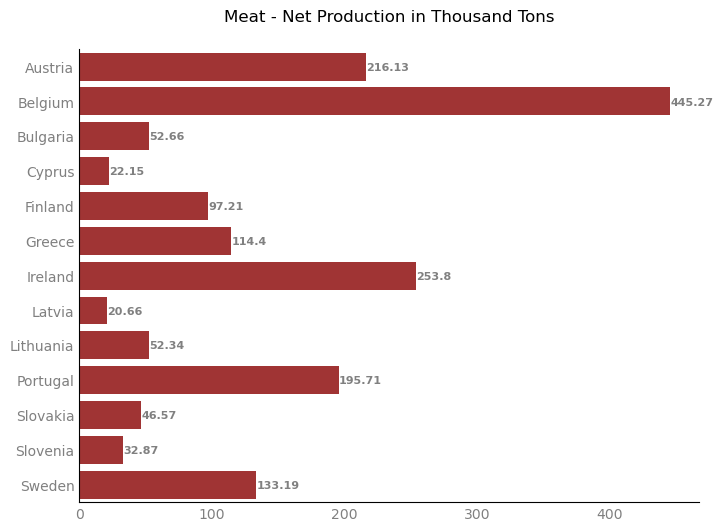

In [32]:
#plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
sns.barplot(x='Net production (tons) (THOUSAND TONS (C.W.E.))',
            y='Country',data=df10, color="firebrick", ci= None)
from matplotlib import rcParams
ax= plt.gca()
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 8, fontweight ='bold',
             color ='grey')
ax.set_title("Meat - Net Production in Thousand Tons", pad=20)
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

***Central Tendency Measures***

These measures will allow us to summarize in a single number all the values reflecting the centre of the data distribution

***Variation Measures***

These measures help us to get values that determine the level of homogeneity within the observations.

In other words, we can see how different/similar the values are.

In [33]:
# df.describe is a way to summarize the data using Descriptive Statistics: 
#Central Tendency and Measures of variability for Numerical features (except Station ID and Latitude and Longitue)
# I am Using .round() to suppress scientific notation.
df10.describe(include=['int64','float64']).round()

,Year,Apparent use (THOUSAND TONS (C.W.E.)),Carcass weight (KG/HEAD),Gross indigenous production (THOUSAND TONS (C.W.E.)),Live exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Live imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.)),Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.)),Net production (heads) (THOUSAND HEAD),Net production (tons) (THOUSAND TONS (C.W.E.))
count,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0,1040.0
mean,2012.0,126.0,92.0,128.0,1.0,4.0,0.0,7.0,18.0,41.0,5.0,51.0,22945.0,129.0
std,6.0,123.0,110.0,183.0,4.0,11.0,0.0,18.0,45.0,111.0,11.0,60.0,53079.0,187.0
min,2002.0,0.0,1.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0
25%,2007.0,20.0,6.0,21.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,256.0,18.0
50%,2012.0,95.0,43.0,72.0,0.0,0.0,0.0,0.0,1.0,8.0,1.0,22.0,1001.0,70.0
75%,2016.0,187.0,111.0,146.0,0.0,3.0,0.0,3.0,11.0,24.0,4.0,82.0,11864.0,147.0
max,2021.0,492.0,578.0,1138.0,35.0,103.0,4.0,150.0,308.0,792.0,82.0,275.0,309118.0,1140.0


In [34]:
# Using df.describe to get summary statistics for objects
df10.describe(include=np.object)

,Country,Commodity
count,1040,1040
unique,13,4
top,Austria,BOVINE
freq,80,260


Dataset Insights so far.

We have **no Missing Data** in any feature , however, there are 0 values for a high number of observations depending of the feature.

An important detail to mention is that this dataset is collection of informations from each country from 2002 till 2021

For this reason the most appropriated exploration is building small subsets of each Country to evaluate some of the statistical tests.

## Inferential Statistic

In [35]:
#Renaming columns
df10.rename(columns = {"Apparent use (THOUSAND TONS (C.W.E.))":'Apparent_use_THOUSAND_TONS_CWE', 
                       "Carcass weight (KG/HEAD)": "Carcass_weight_KG/HEAD",
                       "Gross indigenous production (THOUSAND TONS (C.W.E.))":"Gross_indigenous_production_THOUSAND_TONS_CWE",
                       "Live exports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Live_exports_Extra_EU_THOUSAND_TONS_CWE",
                       "Live exports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Live_exports_Intra_EU_THOUSAND_TONS_CWE",
                       "Live imports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Live_imports_Extra_EU_THOUSAND_TONS_CWE",
                       "Live imports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Live_imports_Intra_EU_THOUSAND_TONS_CWE",
                       "Meat exports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Meat_exports_Extra_EU_THOUSAND_TONS_CWE",
                       "Meat exports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Meat_exports_Intra_EU_THOUSAND_TONS_CWE",
                       "Meat imports (Extra-EU) (THOUSAND TONS (C.W.E.))":"Meat_imports_Extra_EU_THOUSAND_TONS_CWE",
                       "Meat imports (Intra-EU) (THOUSAND TONS (C.W.E.))":"Meat_imports_Intra_EU_THOUSAND_TONS_CWE",
                       "Net production (heads) (THOUSAND HEAD)":"Net_production_heads_THOUSAND_EAD",
                       "Net production (tons) (THOUSAND TONS (C.W.E.))":"Net_production_tons_THOUSAND_TONS_CWE"
                          }, inplace = True)

As I am working with some samples of populations It is important to know that the mean observed refers to a sample but not necessarily it represents the entire population mean, that is the reason why we need Confidence Interval.

According to Weiss 2017 p. 355

Confidence interval for a mean is a range of values that is likely to contain a population mean with a certain level of confidence.

It is calculated as:

Confidence Interval = x +/-  t*(s/√n)

where:

x = sample mean (Xbar)

t = t-value that corresponds to the confidence level

s = sample standard deviation

n = sample size

### Confidence Intervals Using the t Distribution.

#### Building the Confidence Interval of Net Production Tons for Bovine in Ireland

Confidence Intervals are useful to solve problems such as the below one:

The Net_production_tons_THOUSAND_TONS_CWE of Bovine in Ireland is known to be normally distributed.

A sample of 20 observations is taken and an average Net_production Tons of 568.062500 and a variance of 1437.2267 were obtained.

Build a confidence interval for the population mean with a confidence of 90%.

As I am working with a small sample (n <30) for each group, I can use the `t.interval()` function from the scipy.stats library to calculate a confidence interval for a population mean.

In [36]:
df_IRE = df10[df10["Country"]=="Ireland"]
bovine_Ireland = df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == "BOVINE"]

In [37]:
bovine_Ireland.describe()

count     20.000000
mean     568.062500
std       37.910774
min      495.400000
25%      544.400000
50%      565.970000
75%      589.895000
max      633.380000
Name: Net_production_tons_THOUSAND_TONS_CWE, dtype: float64

In [38]:
import statistics
variance_bovine_IRE = statistics.variance(bovine_Ireland) 
print("The variance of Net Production Tons for Bovine in Ireland is:"+ str(variance_bovine_IRE))

The variance of Net Production Tons for Bovine in Ireland is:1437.2267671052628


In [39]:
#Import Libraries
import numpy as np
import scipy.stats as st

#define sample data
data = bovine_Ireland
#create 90% confidence interval for population mean weight
print("The 90% confidence interval for the population mean of Net Production for Bovine in Ireland is :" + str(st.t.interval(alpha=0.90, df=len(data)-1, loc=np.mean(data), scale=st.sem(data))))

The 90% confidence interval for the population mean of Net Production for Bovine in Ireland is :(553.4044566223544, 582.7205433776454)


#### Building the Confidence Interval of Net Production Tons for Bovine in Austria

The Net_production_tons_THOUSAND_TONS_CWE of Bovine in Austria is known to be normally distributed.

A sample of 20 observations is taken and an average Net_production Tons of 219.97550 and a variance of 66.760005 were obtained.

Build a confidence interval for the population mean with a confidence of 90%.

In [40]:
# Building Austria Bovine subsets
df_AUT = df10[df10["Country"]=="Austria"]
bovine_Austria = df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity == "BOVINE"]

In [41]:
bovine_Austria.describe()

count     20.00000
mean     219.97550
std        8.17068
min      203.76000
25%      215.20250
50%      221.14000
75%      226.36750
max      233.46000
Name: Net_production_tons_THOUSAND_TONS_CWE, dtype: float64

In [42]:
#Variance Bovine Austria
variance_bovine_AUT = statistics.variance(bovine_Austria) 
print("The variance of Net Production Tons for Bovine in Austria is:"+ str(variance_bovine_AUT))

The variance of Net Production Tons for Bovine in Austria is:66.760005


In [43]:
#define Austria sample data
data = bovine_Austria

#create 90% confidence interval for population mean weight
print("The 90% confidence interval for the population mean of Net Production for Bovine in Austria is :" + str(st.t.interval(alpha=0.90, df=len(data)-1, loc=np.mean(data), scale=st.sem(data))))

The 90% confidence interval for the population mean of Net Production for Bovine in Austria is :(216.81634063686016, 223.13465936313975)


#### Building the Confidence Interval of Net Production Tons for Bovine in Portugal.

The Net_production_tons_THOUSAND_TONS_CWE of Bovine in Portugal is known to be normally distributed.

A sample of 20 observations is taken and an average Net_production Tons of 97.902000 and a variance of 104.2818694736842 were obtained.

Build a confidence interval for the population mean with a confidence of 90%.

In [44]:
# Building Portugal Bovine subsets 
df_PTO = df10[df10["Country"]=="Portugal"]
bovine_Portugal = df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == "BOVINE"]

In [45]:
bovine_Portugal.describe()

count     20.000000
mean      97.902000
std       10.211849
min       79.840000
25%       91.212500
50%       94.895000
75%      104.750000
max      118.520000
Name: Net_production_tons_THOUSAND_TONS_CWE, dtype: float64

In [46]:
# Variance Bovine Portugal
variance_bovine_PTO = statistics.variance(bovine_Portugal) 
print("The variance of Net Production Tons for Bovine in Portugal is:"+ str(variance_bovine_PTO))

The variance of Net Production Tons for Bovine in Portugal is:104.2818694736842


In [47]:
#define Portugal sample data
data = bovine_Austria

#create 90% confidence interval for population mean weight
print("The 90% confidence interval for the population mean of Net Production for Bovine in Portugal is :" + str(st.t.interval(alpha=0.90, df=len(data)-1, loc=np.mean(data), scale=st.sem(data))))

The 90% confidence interval for the population mean of Net Production for Bovine in Portugal is :(216.81634063686016, 223.13465936313975)


### Hypothesis Tests

Lets plot some Box plots to evaluate our variable Net Production along the Countries.

A box plot shows us 5 key numbers and it gives us a particular look at the distribution of a numeric variable.

The 5 key numbers are:

Minimum (Min)

Quartile 1 (25th Percentile)

Median (50th Percentile)

Quartile 3 (75th Percentile)

Maximum (Max)

In [48]:
#df_all_coutries_bovine = df10[df10["Commodity"]=="BOVINE"]

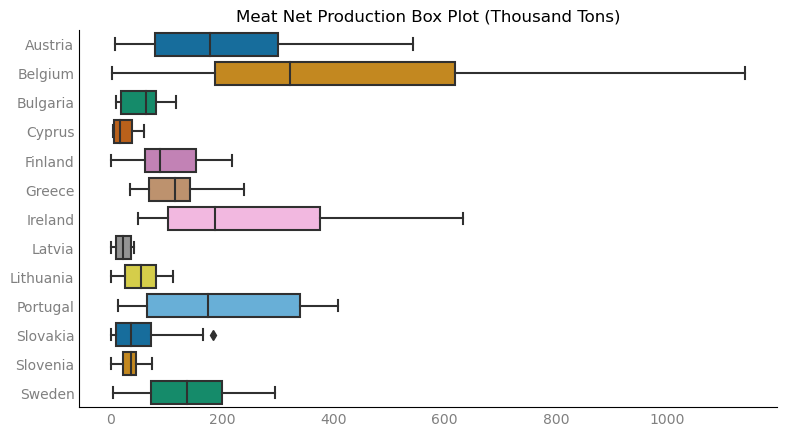

In [49]:
# Box Plot
plt.figure(figsize=(9, 5))
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Country', 
            data=df10,palette="colorblind").set(title='Meat Net Production Box Plot (Thousand Tons)')
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

The above plot suggests that some countries such as Austria and Portugal might be similar to Ireland.

Lets broke-down the Meat Production by each one of the commodities for the tree countries and see if they are really similar.

In [50]:
countries= ["Ireland","Portugal","Austria"]
df_comparison = df10[df10.Country.isin(countries)]

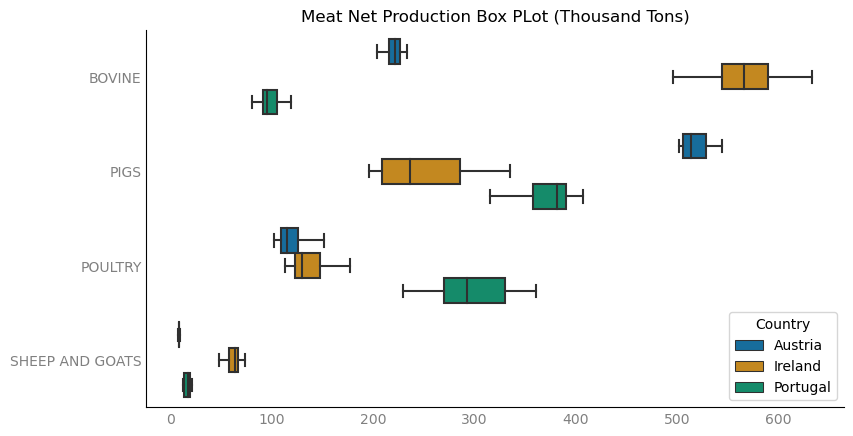

In [51]:
#Box PLot
plt.figure(figsize=(9, 5))
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Commodity',hue="Country",
            data=df_comparison,palette="colorblind").set(title='Meat Net Production Box PLot (Thousand Tons)')
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

The above plot suggests those tree countries are completely different.

Ireland produces more Bovine, Austria more Pigs while Poultry is the second highest production for Portugal.

However, this assumption cannot be made looking plots, it is important to perform statistical test to evaluate this hypothesis rejecting or accepting according to the test results.

**Ho**: The countries have similarity patters of Meat Net Production.

**Ha**: The countries have no similarity patter of Meat Net Production.

There are several things that can be tested and many types of tests available, however, each one is applicable specifically for each situation.

To select the right statistical test, it is import know more about you features (type, distribution, the number of groups being compared, if parametric or no parametric etc.)

Also, it is important reinforce the importance of no missing values and a no presence of outliers once both would affect our central tendency measures compromising our statistical tests. (This was previous check during data exploration).


#### Ireland Analyses and Hypotheses tests

##### Shapiro Test Irish subset

The Shapiro-Wilk test examines if a variable is normally distributed in some population.

As there are 4 populations for the Meat Variable (Bovine,Pig , Poultry and Sheep).

Four hypotheses tests will be performed separately for each group.

This can be automated creating a `for loop function()` in python.

Setting 4 hypotheses test to check about the distribution for the Irish subset for each commodity.

**Ho**: Sample of Bovine is from the normal distributions.(P>0.05)\
**Ha**: Sample of Bovine is not from the normal distributions.


**Ho**: Sample of Pigs is from the normal distributions.(P>0.05)\
**Ha**: Sample of Pigs is not from the normal distributions.


**Ho**: Sample of Poultry is from the normal distributions.(P>0.05)\
**Ha**: Sample of Poultry is not from the normal distributions.


**Ho**: Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
**Ha**: Sample of Sheep and Goats is not from the normal distributions.

In [52]:
#Shapiro wilk test
from scipy import stats
for i in ["BOVINE","PIGS","POULTRY","SHEEP AND GOATS"]:
     print(i + ": " + str(stats.shapiro(df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == i])))

BOVINE: ShapiroResult(statistic=0.9765170812606812, pvalue=0.8816961050033569)
PIGS: ShapiroResult(statistic=0.8979106545448303, pvalue=0.03768857568502426)
POULTRY: ShapiroResult(statistic=0.8904536962509155, pvalue=0.027413763105869293)
SHEEP AND GOATS: ShapiroResult(statistic=0.9555279016494751, pvalue=0.45880091190338135)


The output confirmed only BOVINE and SHEEP AND GOATS sample are from a normal distribution.

Ho ✅ (<span style="color:green">Accepted</span>): Sample of Bovine is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Bovine is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Pigs is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Pigs is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Poultry is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Poultry is not from the normal distributions.


Ho ✅ (<span style="color:green">Accepted</span>): Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Sheep and Goats is not from the normal distributions.


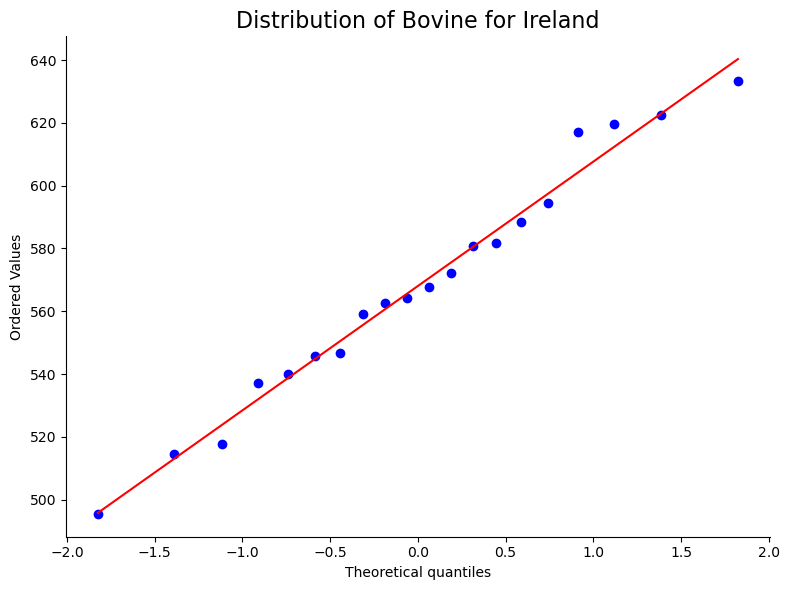

In [53]:
#Normality plot of Irish commodit Bovine"
import matplotlib.pyplot as pt
stats.probplot(df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity =="BOVINE"], plot=plt);
pt.title('Distribution of Bovine for Ireland',color="black", size=16)
pt.tight_layout()
sns.despine()

##### KRUSKAL-WALLIS Test Irish subset

A Kruskal-Wallis Test is used to determine whether or not there is a statistically significant difference between the medians of three or more independent groups.

The previous test (Shapiro test) confirmed not all the groups present normal distribution for the dependent variable ***Net_production_tons_THOUSAND_TONS_CWE*** for that reason the Kruskal-Wallis is the appropriate test

Kruskal-Wallis is considered to be the non-parametric equivalent of the One-Way ANOVA.

In [54]:
bovine_Ireland = df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == "BOVINE"]
pigs_Ireland = df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == "PIGS"]
poutry_Ireland = df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == "POULTRY"]
sheep_Ireland = df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == "SHEEP AND GOATS"]

Setting the Hypothesis :

**Ho**: The median is equal across all groups..(P>0.05)

**Ha**: The median is not equal across all groups.

In [55]:
#perform Kruskal-Wallis Test 
stats.kruskal(bovine_Ireland, pigs_Ireland, poutry_Ireland,sheep_Ireland)

KruskalResult(statistic=74.07494227546033, pvalue=5.719458795527305e-16)

Ho ❌ (<span style="color:red">Rejected</span>): The median is equal across all groups.(P>0.05)

Ha ✅ (<span style="color:green">Accepted</span>): The median is not equal across all groups

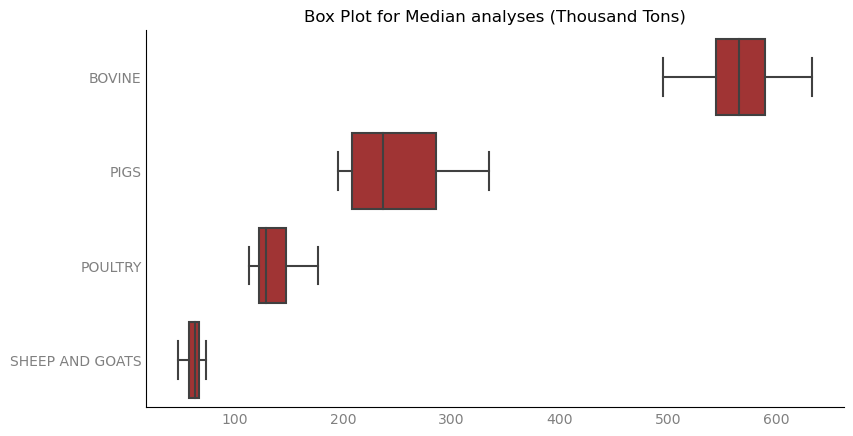

In [56]:
# BoxPLot
plt.figure(figsize=(9, 5))
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Commodity',
            data=df_IRE,color="firebrick").set_title('Box Plot for Median analyses (Thousand Tons)');
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

#### Austria Analyses and Hypotheses tests

#####  Shapiro Test Austrian subset

In [57]:
df_AUT = df10[df10["Country"]=="Austria"]

Setting 4 hypotheses test to check about the distribution for the Swedish subset for each commodity.

**Ho**: Sample of Bovine is from the normal distributions.(P>0.05)\
**Ha**: Sample of Bovine is not from the normal distributions.


**Ho**: Sample of Pigs is from the normal distributions.(P>0.05)\
**Ha**: Sample of Pigs is not from the normal distributions.


**Ho**: Sample of Poultry is from the normal distributions.(P>0.05)\
**Ha**: Sample of Poultry is not from the normal distributions.


**Ho**: Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
**Ha**: Sample of Sheep and Goats is not from the normal distributions.

In [58]:
#Shapiro wilk test
for i in ["BOVINE","PIGS","POULTRY","SHEEP AND GOATS"]:
     print(i + ": " + str(stats.shapiro(df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity == i])))

BOVINE: ShapiroResult(statistic=0.9654181599617004, pvalue=0.6566981673240662)
PIGS: ShapiroResult(statistic=0.9023046493530273, pvalue=0.04556182771921158)
POULTRY: ShapiroResult(statistic=0.8995003700256348, pvalue=0.04035911336541176)
SHEEP AND GOATS: ShapiroResult(statistic=0.9559043645858765, pvalue=0.46560555696487427)


For Sweden, the output confirmed that BOVINE, PIGS and POULTRY samples are from a normal distribution.

Ho ✅ (<span style="color:green">Accepted</span>): Sample of Bovine is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Bovine is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Pigs is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Pigs is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Poultry is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Poultry is not from the normal distributions.


Ho ✅ (<span style="color:green">Accepted</span>): Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Sheep and Goats is not from the normal distributions.

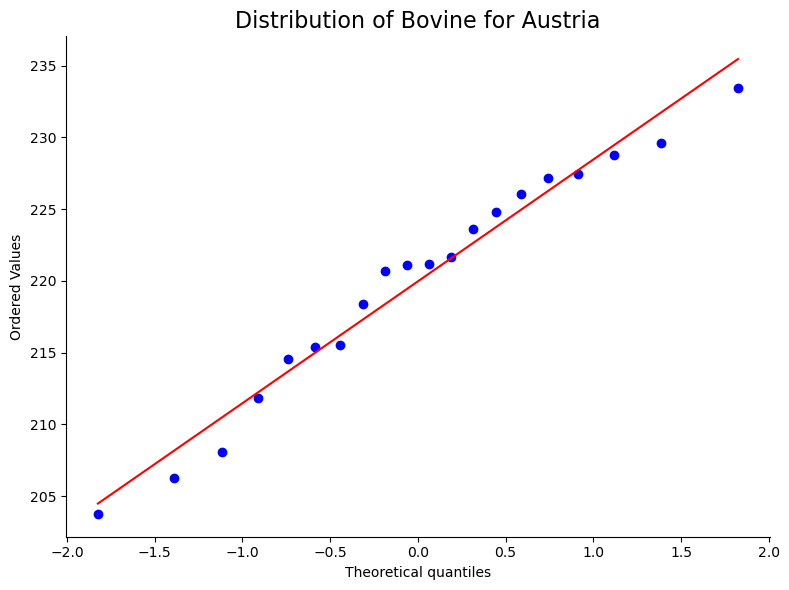

In [59]:
#visualise the distribution of Bovine for Austria subset (Normal Distributed)
stats.probplot(df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity =="BOVINE"], plot=plt);
pt.title('Distribution of Bovine for Austria',color="black", size=16)
pt.tight_layout()
sns.despine()

##### KRUSKAL-WALLIS Test Austrian subset

A Kruskal-Wallis Test is used to determine whether or not there is a statistically significant difference between the medians of three or more independent groups.

The previous test (Shapiro test) confirmed not all the groups present normal distribution for the dependent variable ***Net_production_tons_THOUSAND_TONS_CWE*** for that reason the Kruskal-Wallis is the appropriate test

In [60]:
bovine_Austria = df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity == "BOVINE"]
pigs_Austria = df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity == "PIGS"]
poutry_Austria = df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity == "POULTRY"]
sheep_Austria = df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity == "SHEEP AND GOATS"]

Setting the Hypothesis :

**Ho**: The median is equal across all groups..(P>0.05)

**Ha**: The median is not equal across all groups.

In [61]:
#perform Kruskal-Wallis Test 
stats.kruskal(bovine_Austria, pigs_Austria, poutry_Austria,sheep_Austria)

KruskalResult(statistic=74.07581049719872, pvalue=5.717009089034554e-16)

Ho ❌ (<span style="color:red">Rejected</span>): The median is equal across all groups.(P>0.05)

Ha ✅ (<span style="color:green">Accepted</span>): The median is not equal across all groups

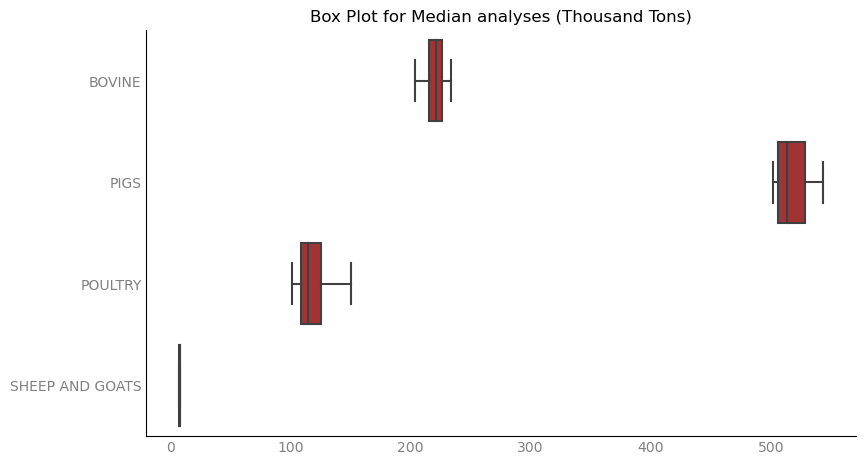

In [62]:
# Change default palette
plt.figure(figsize=(9, 5))
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Commodity', color="firebrick",
            data=df_AUT).set_title('Box Plot for Median analyses (Thousand Tons)');
plt.tight_layout()
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

#### Portugal Analyses and Hypotheses tests

##### Shapiro Test Portuguese subset

In [63]:
# Building subsets 
df_PTO = df10[df10["Country"]=="Portugal"]

Setting 4 hypotheses test to check about the distribution for the Irish subset for each commodity.

**Ho**: Sample of Bovine is from the normal distributions.(P>0.05)\
**Ha**: Sample of Bovine is not from the normal distributions.


**Ho**: Sample of Pigs is from the normal distributions.(P>0.05)\
**Ha**: Sample of Pigs is not from the normal distributions.


**Ho**: Sample of Poultry is from the normal distributions.(P>0.05)\
**Ha**: Sample of Poultry is not from the normal distributions.


**Ho**: Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
**Ha**: Sample of Sheep and Goats is not from the normal distributions.

In [64]:
#Shapiro wilk test
for i in ["BOVINE","PIGS","POULTRY","SHEEP AND GOATS"]:
     print(i + ": " + str(stats.shapiro(df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == i])))

BOVINE: ShapiroResult(statistic=0.9523159861564636, pvalue=0.40361833572387695)
PIGS: ShapiroResult(statistic=0.8788883090019226, pvalue=0.016897428780794144)
POULTRY: ShapiroResult(statistic=0.9448164701461792, pvalue=0.2951621115207672)
SHEEP AND GOATS: ShapiroResult(statistic=0.8884308934211731, pvalue=0.025166984647512436)


For Portugal, the output confirmed that BOVINE, and POULTRY samples are from a normal distribution.

Ho ✅ (<span style="color:green">Accepted</span>): Sample of Bovine is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>): Sample of Bovine is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Pigs is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Pigs is not from the normal distributions.


Ho ✅ (<span style="color:green">Accepted</span>): Sample of Poultry is from the normal distributions.(P>0.05)\
Ha ❌ (<span style="color:red">Rejected</span>):: Sample of Poultry is not from the normal distributions.


Ho ❌ (<span style="color:red">Rejected</span>): Sample of Sheep and Goats is from the normal distributions.(P>0.05)\
Ha ✅ (<span style="color:green">Accepted</span>): Sample of Sheep and Goats is not from the normal distributions.

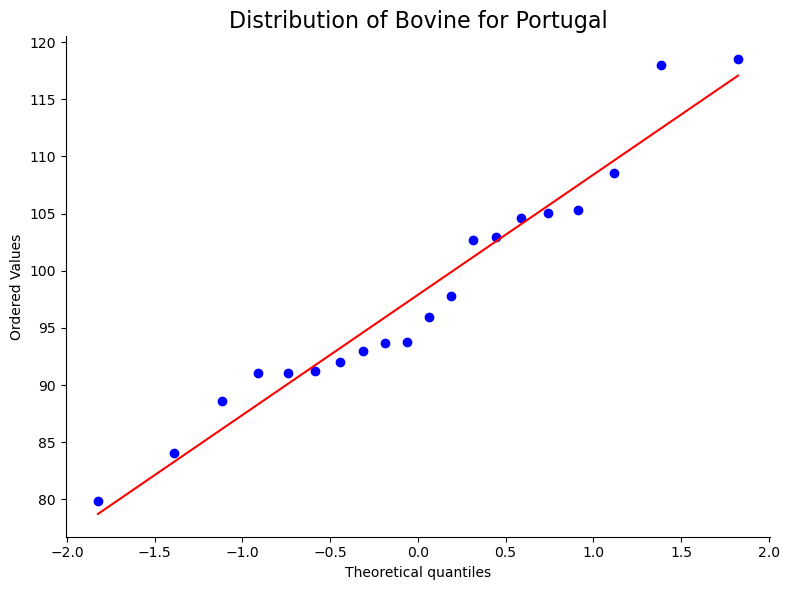

In [65]:
#visualise the distribution of Bovine for Sweden subset (Normal Distributed)
stats.probplot(df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity =="BOVINE"], plot=plt);
pt.title('Distribution of Bovine for Portugal',color="black", size=16)
pt.tight_layout()
sns.despine()

##### KRUSKAL-WALLIS Test Portuguese subset

The previous test (Shapiro test) confirmed not all the groups present normal distribution for the dependent variable ***Net_production_tons_THOUSAND_TONS_CWE*** for that reason the Kruskal-Wallis is the appropriate test to check if the there are a statistically significant difference between the medians of three or more independent groups.

In [66]:
bovine_Portugal = df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == "BOVINE"]
pigs_Portugal = df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == "PIGS"]
poutry_Portugal = df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == "POULTRY"]
sheep_Portugal = df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == "SHEEP AND GOATS"]

**Ho**: The median is equal across all groups..(P>0.05)

**Ha**: The median is not equal across all groups.

In [67]:
#perform Kruskal-Wallis Test 
stats.kruskal(bovine_Portugal, pigs_Portugal, poutry_Portugal,sheep_Portugal)

KruskalResult(statistic=72.27418042874392, pvalue=1.39053442793444e-15)

Ho ❌ (<span style="color:red">Rejected</span>): The median is equal across all groups.(P>0.05)

Ha ✅ (<span style="color:green">Accepted</span>): The median is not equal across all groups

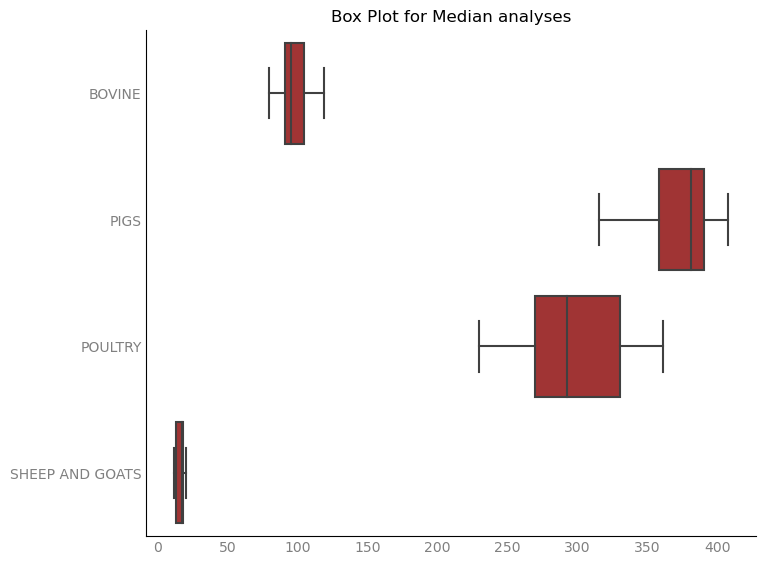

In [68]:
# Box plot for Median Evaluation
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Commodity',color="firebrick",
            data=df_PTO).set_title('Box Plot for Median analyses');
plt.tight_layout()
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

Since this p-value is less than 0.05, we can reject the null hypothesis

There is sufficient evidence to conclude that there are statistically significant differences in the median of each group.

#### Bartlett's for testing variance between groups normally distributed

Bartlett’s test is used to check whether all samples have the same variance.

Also known as test for homogeneity.

It’s utilized when the data is almost certainly from a Gaussian distribution or normal distribution.

In this case this test can be use as Bovine has a normal distribution for all three countries.

This is a hypotheses test, and the two hypotheses are as follows:


**Ho**: The groups have equal variance.(P>0.05)

**Ha**: One group has a different variance compared to the others.

In [69]:
bovine_Ireland = df_IRE.Net_production_tons_THOUSAND_TONS_CWE[df_IRE.Commodity == "BOVINE"]
bovine_Austria = df_AUT.Net_production_tons_THOUSAND_TONS_CWE[df_AUT.Commodity == "BOVINE"]
bovine_Portugal = df_PTO.Net_production_tons_THOUSAND_TONS_CWE[df_PTO.Commodity == "BOVINE"]

In [70]:
#Homogeinity of variance: Bartlett's test
import scipy.stats as stats
test_statistic, p_value = stats.bartlett(bovine_Ireland,bovine_Austria, bovine_Portugal)
print(test_statistic, p_value)

50.7629565265463 9.483399534354658e-12


Ho ❌ (<span style="color:red">Rejected</span>): The groups have equal variance.(P>0.05)

Ha ✅ (<span style="color:green">Accepted</span>): One group has a different variance compared to the others.

In [71]:
df_comparison_bovine = df_comparison[df_comparison.Commodity=="BOVINE"]

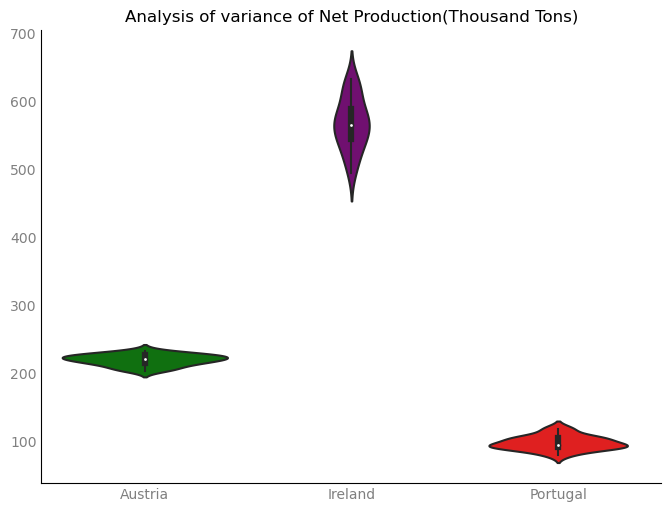

In [72]:
# Violinplot to visualize variance
sns.set_palette(['green', 'purple', 'red'])
sns.violinplot(y='Net_production_tons_THOUSAND_TONS_CWE', 
               x="Country",data=df_comparison_bovine).set_title('Analysis of variance of Net Production(Thousand Tons)')
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

The plot suggest Austria and Portugal may have equal variance.

This is a hypotheses test and the two hypotheses are as follows:

**Ho**: The groups Austria and Portugal have equal variance.(P>0.05)

**Ha**: One group has a different variance compared to the other.

In [73]:
#Homogeinity of variance: Bartlett's test
import scipy.stats as stats
test_statistic, p_value = stats.bartlett(bovine_Austria, bovine_Portugal)
print(test_statistic, p_value)

0.9130664111191438 0.3393021166315214


Ho ✅ (<span style="color:green">Accepted</span>): The groups have equal variance.(P>0.05)

Ha ❌ (<span style="color:red">Rejected</span>): One group has a different variance compared to the others.

#### T-Test

Finally, a T-Test is a hypothesis test used to test the equality of two population means.

Let’s test this hypothesis using Austria and Portugal.

**Ho**: The means are equal.(P>0.05)

**Ha**: The means are not equal.

In [74]:
print(stats.ttest_ind(bovine_Austria, bovine_Portugal).pvalue)

2.3403228185311313e-33


Ho ❌ (<span style="color:red">Rejected</span>): The means are equal.(P>0.05)

Ha ✅ (<span style="color:green">Accepted</span>): Means are not equal.

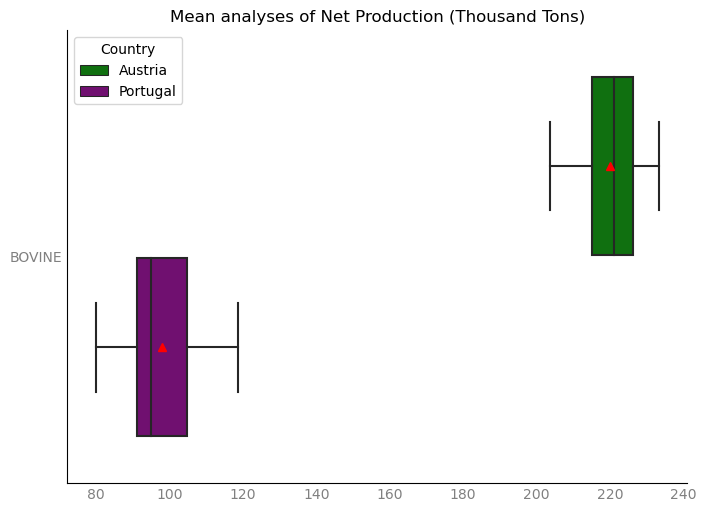

In [75]:
# BoxPlot to visualize Means
countries= ["Portugal","Austria"]
df_comparison = df10[df10.Country.isin(countries)]
sns.boxplot(x="Net_production_tons_THOUSAND_TONS_CWE", y='Commodity',hue="Country",
            data=df_comparison[df_comparison["Commodity"]=="BOVINE"],
            showmeans=True).set_title('Mean analyses of Net Production (Thousand Tons)')
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

All those statistical tests have confirmed.

Ha ✅ (<span style="color:green">Accepted</span>): The countries have no similarity patters of Meat Net Production.

It is clear each country has a very specific patterns and trends in regards to that variable (Net Production).

What about the other countries and the other variables ?

Do they have different patterns and trends that could be learned by a Machine Learning model?

Is it possible to use those patterns and trend to build a model capable to classify an observation correctly?

## Classification Model

In [76]:
# Load libraries
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [77]:
df = df10[df10["Year"]!=2021]
df21 = df10[df10["Year"]==2021]

In [78]:
# isolated the target variable
X = df.drop(['Country'],axis=1)
y = df.filter(['Country'])

According to IBM supervised machine learning, is a subcategory of machine learning. 

It is defined by its use of labeled datasets to train algorithms that to classify data or predict outcomes accurately. 

As input data is fed into the model, it adjusts its weights until the model has been fitted appropriately, which occurs as part of the cross validation process. 

Supervised learning can be separated into two types of problems classification and regression:

Classification uses an algorithm to accurately assign test data into specific categories. It recognizes specific entities within the dataset and attempts to draw some conclusions on how those entities should be labeled or defined.

There are different classification techniques and methods 

Classification Techniques.

***Base Classifiers***

Nearest-neighbor , Decision Tree based Methods , Rule-based Methods ,Neural Networks, Naïve Bayes and Bayesian Belief Networks , Support Vector Machines

***Ensemble Classifiers***

Boosting, Bagging, Random Forests


Evaluating the below plot seems there is no clear separation between all the classes when considering Euclidean distance.

This inside can be an indication of models based on Decision tree might perform better for this problem.

We can test this applying some of those models with hyper-parameters by default and cross validation to select best models.

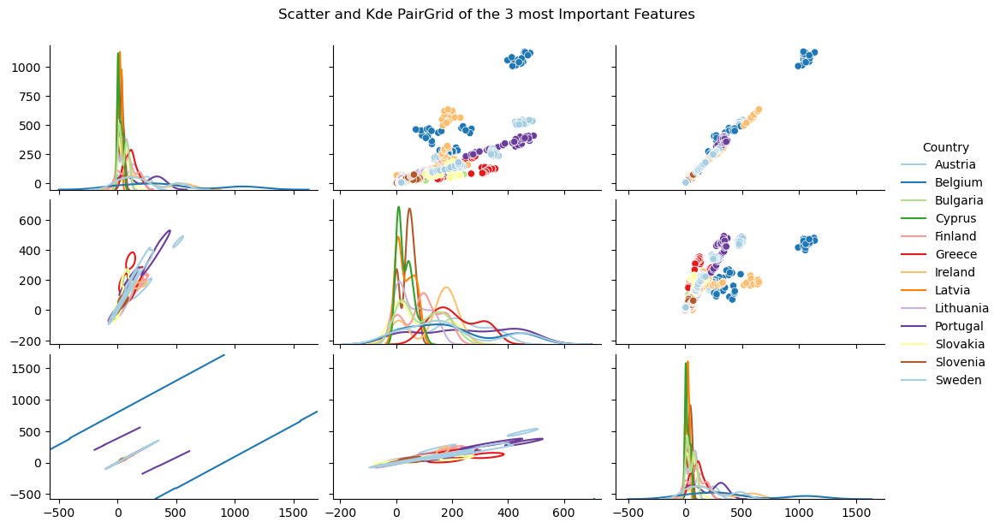

In [79]:
# PairGrid of 3 most important features.
g = sns.PairGrid(df, hue="Country", height=2, aspect=1.8, diag_sharey= False, palette= "Paired",
                 vars=["Net_production_tons_THOUSAND_TONS_CWE","Apparent_use_THOUSAND_TONS_CWE","Gross_indigenous_production_THOUSAND_TONS_CWE"]);
g.map_upper(sns.scatterplot)
g.map_diag(sns.kdeplot)
g.map_lower(sns.kdeplot)
g.add_legend()
g.tight_layout();
g.set(xlabel='', ylabel='')
g.fig.suptitle("Scatter and Kde PairGrid of the 3 most Important Features", y =1.05)
sns.despine();

### Feature Importance

Using models based on Tree it is an interesting technique to evaluate feature importance.

Seems the categorical features are not adding value to the model.

This can be tested running the model twice with all variables and excluding the ones with less importance to measure if there is an impact on the results.

In [80]:
#dummy encode categorical features with drop first false we are going to get the same result to one hot enconding.
pd.set_option('display.max_columns', None)
df_dummies = pd.get_dummies(X, drop_first=False)

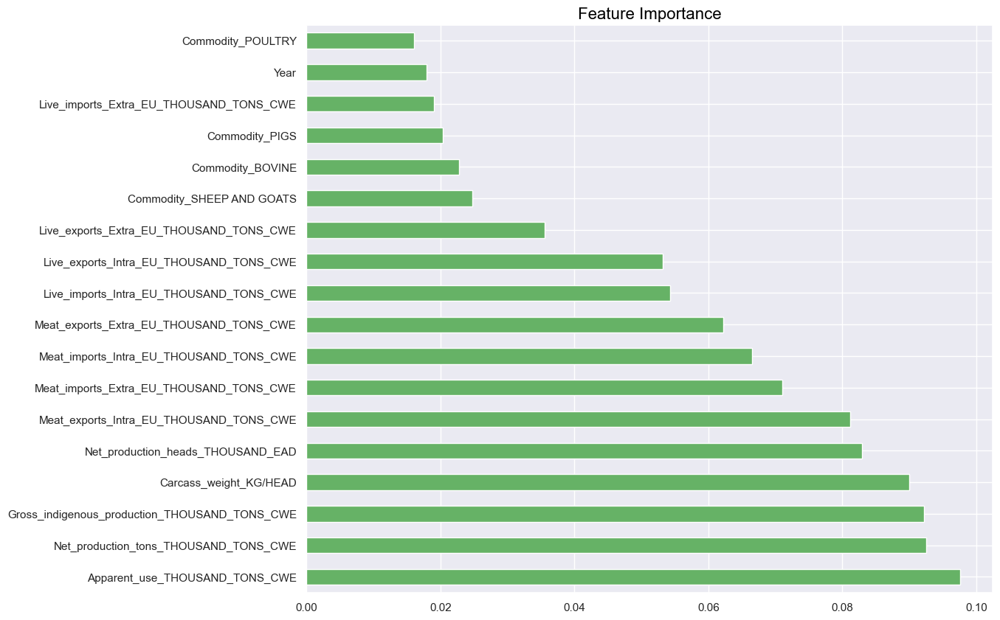

In [81]:
#Importing libraries
from sklearn.ensemble import ExtraTreesClassifier

import matplotlib.pyplot as plt
plt.rcdefaults()
mpl.rcdefaults()

#Build and fit the model
model = ExtraTreesClassifier()
model.fit(df_dummies,y)

#plot graph of feature importances for better visualization
sns.set(rc={'figure.figsize':(12,10)})
feat_importances = pd.Series(model.feature_importances_, index=df_dummies.columns)
feat_importances.nlargest(18).plot(kind='barh',color='#66B266');
plt.title('Feature Importance',color="black", size=16)
plt.show()
#sns.despine();

In [82]:
X= X.drop(["Commodity","Year","Live_imports_Extra_EU_THOUSAND_TONS_CWE"],1)
#X = pd.get_dummies(data=X, drop_first=True)

In [83]:
X.shape, y.shape

((988, 12), (988, 1))

### Model Selection and Feature Selection using CV and algorithms by default

To  make sure the model will have the same opportunity to learn about all the countries equally it is important to train the model with a good balance of the labels using similar or equal observations of each country.\
This could be done addressing the split test partition keeping the same volume of observation of each country or using cross validation.

In [84]:
# All countrie has the same number of observations
df10.Country.groupby(df10.Country).count()

Country
Austria      80
Belgium      80
Bulgaria     80
Cyprus       80
Finland      80
Greece       80
Ireland      80
Latvia       80
Lithuania    80
Portugal     80
Slovakia     80
Slovenia     80
Sweden       80
Name: Country, dtype: int64

As we have previously seen, our dataset contains 80 observations of each country.

For this experiment cross validation will be used to train the model.

This approach involves randomly dividing the set of observations into k groups, or folds, of approximately equal size.\
The first fold is treated as a validation set, and the method is fit on the remaining k − 1 folds.

— Page 181, An Introduction to Statistical Learning, 2013.

Also, I am going to use the `random_state` parameter in order to set a seed for
${\tt python}$’s random number generator, so that you'll obtain precisely the same results each time. 

It is generally a good idea to set a random seed when performing an analysis such as cross-validation
that contains an element of randomness, so that the results obtained can be reproduced precisely at a later time.

In [85]:
from sklearn.model_selection import cross_val_score
# DECISION TREE MODEL
from sklearn.tree import DecisionTreeClassifier 
dt = DecisionTreeClassifier(random_state =42)
dt = cross_val_score(dt, X, y, cv=10, scoring ='accuracy') 

# RANDOM FOREST MODEL
from sklearn.ensemble import RandomForestClassifier
clf=RandomForestClassifier(random_state =42)
clf = cross_val_score(clf, X, y,cv=10, scoring ='accuracy')

# KNN MODEL
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn = cross_val_score(knn, X, y, cv = 10, scoring ='accuracy')

# LOGISTIC REGRESSION MODEL
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression(random_state =52)
lg = cross_val_score(lg, X, y, cv = 10, scoring ='accuracy')

# SUPPORT VECTOR MACHINE MODEL
from sklearn import svm
svc = svm.SVC(random_state =42)
svc = cross_val_score(svc, X, y, cv = 10, scoring ='accuracy')
print("Mean Accuracy for Decision Tree: " + str(np.mean(dt)))
print("Mean Accuracy for Random Forest: " + str(np.mean(clf)))
print("Mean Accuracy for KNN: " + str(np.mean(knn)))
print("Mean Accuracy for Logistic Regression: " + str(np.mean(lg)))
print("Mean Accuracy for Support Vector Machine: " + str(np.mean(svc)))

Mean Accuracy for Decision Tree: 0.721696557410843
Mean Accuracy for Random Forest: 0.8876623376623376
Mean Accuracy for KNN: 0.637569573283859
Mean Accuracy for Logistic Regression: 0.19325912183055038
Mean Accuracy for Support Vector Machine: 0.15266955266955268


The above output confirmed that models based on Tree can deal with this dataset.\
From now Random Forest is going to be the one selected to continue.

### Improving Randon Forest

As previous exposed the dataset contains 80 observations of each country.

As Cross validation will be used for train and test I dont need to worie about balancing the labels.

However a small fraction (Year 2021) will be isolated as an unseen partition to evaluate if the model is going to generalize well for unknown data in the future.

In order to improve the results I decided do a grid search to improve the model using better hyperparameters and cross validation.

The below code has been used for this task, with the output generated detailing the best hyperparameters:

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV

rfc=RandomForestClassifier(random_state=42)

param_grid = {'n_estimators': [200,400],
              'max_features': ['auto', 'sqrt', 'log2'],
              'max_depth' : [6,7,8], 
              'criterion' :['gini', 'entropy']}

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)

CV_rfc.fit(X, y)

print(CV_rfc.best_params_)

##### Output : {'criterion': 'entropy', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 500}

In [86]:
X.shape,y.shape

((988, 12), (988, 1))

In [87]:
clf=RandomForestClassifier(criterion='entropy',max_depth = 8, max_features ='auto', n_estimators=200, random_state=42)

In order to avoid problems such as overfitting Cross Validation is a good approach.

As the data set is not too large Leave One Out Cross Validation suit us.

The LOOCV estimate can be automatically computed for any generalized linear model using the `LeaveOneOut()` and `KFold()` functions.

from sklearn.model_selection import cross_val_score

from sklearn.model_selection import LeaveOneOut

loo = LeaveOneOut()

X = pd.DataFrame(X).values.reshape(-1,12)

y = pd.DataFrame(y).values.reshape(-1,1)

loo.get_n_splits(X)


from sklearn.model_selection import KFold

crossvalidation = KFold(n_splits=988, random_state=None, shuffle=False)

scores = cross_val_score(clf, X, y, scoring ='accuracy', cv=crossvalidation, n_jobs=1)

print("Folds: " + str(len(scores)) + ", Mean Accuracy for Random Forest: " + str(np.mean(scores))) 

Great improvment from 88% to 98%

I am going to retrain the model using the all observations from years 2002 till 2020.

After that I am going to use the trained model to predict labels for 2021 figures and compare with the real value using Confusion Matrix.

This is a process to check the models ability to generalize, in simple words generalization is a term use to describe the models ability to  digest new data and make accurated predictions avoinding overfitting and underfitting.

In [88]:
# Split data traning and test partition
X_train = pd.DataFrame(X) #Independent Variabels from year 2002 till 2020
y_train = pd.DataFrame(y,columns=["Country"]) # Labels from year 2002 till 2020


X_test = df21.drop(['Country',"Commodity","Year","Live_imports_Extra_EU_THOUSAND_TONS_CWE"],1)#.reset_index(drop=True)
y_test = df21.filter(['Country']).reset_index(drop=True)# labels from year 2021

In [89]:
#Retraining the Model with data from 2002 till 2020 and predicting 2021
clf = RandomForestClassifier(criterion='entropy',max_depth = 6, max_features ='auto', n_estimators=200, random_state =42)
clf.fit(X_train, y_train)

# re-making the predictions
y_pred= clf.predict(X_test)
X_pred= clf.predict(X_train)

# Model Accuracy, how often is the classifier correct?
import sklearn.metrics as metrics
print("Accuracy for the Test partition:",metrics.accuracy_score(y_test, y_pred))
print("Accuracy for the Train partition:",metrics.accuracy_score(y_train, X_pred))

Accuracy for the Test partition: 0.9615384615384616
Accuracy for the Train partition: 0.9827935222672065


The model presented a good balance as per above output, but it also inportant to check other measures to understand more about the model.

The confusion matrix is a useful visualization tool that provides analysis on the true negative, false positive, false negative, and true positives made by our model. Beyond a simple accuracy metric, we should also look at the confusion matrix to understand the performance of the model.The definition of true negative, false positive, false negative, and true positives are as follows:

- True negative: Actual class is negative, and the model predicted negative
- False positive: Actual class is negative, but the model predicted positive
- False negative: Actual class is positive, but the model predicted negative
- True positive: Actual class is positive, and the model predicted positive

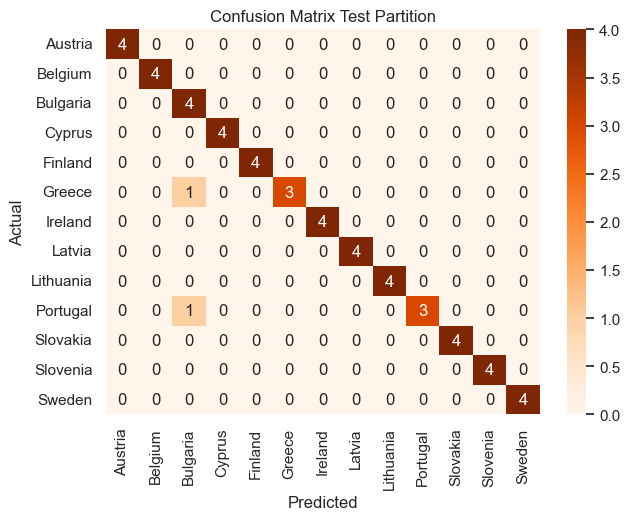

In [90]:
#Confusion Matrix Test Partition
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
data = {'Actual':    y_test['Country'],'Predicted': y_pred}
df = pd.DataFrame(data, columns=['Actual','Predicted'])
confusion_matrix = pd.crosstab(df['Actual'], df['Predicted'], rownames=['Actual'], colnames=['Predicted'])

_=sns.heatmap(confusion_matrix, annot=True, fmt='g', cmap='Oranges').set_title('Confusion Matrix Test Partition');

Great results from Test Partition:

50 True Positives.

Only Portugal and Greece have had 1 False negative each country.

Only Bulgaria have had 2 False positives.

50 True negatives.

In [91]:
y_train.shape, X_pred.shape

((988, 1), (988,))

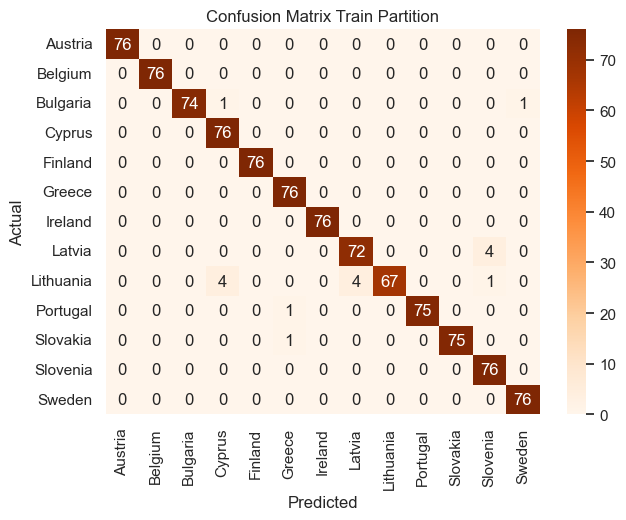

In [92]:
#Selecting Data
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
data = {'Actual':    y_train['Country'],'Predicted': X_pred}
df = pd.DataFrame(data, columns=['Actual','Predicted'])
confusion_matrix = pd.crosstab(df['Actual'], df['Predicted'], rownames=['Actual'], colnames=['Predicted'])

_=sns.heatmap(confusion_matrix, annot=True, fmt='g', cmap='Oranges').set_title('Confusion Matrix Train Partition');

Great results from Train Partition:

975 True Positives.

Cyprus (2), Finland (1), Greece (1), Latvia (4) and Slovenia (5) have had False Positive (Total 13).

Latvia (3) , Lithuania (9) and Slovakia (1) have had False Negative (Total 13).

975 True negatives.

The Above output suggest for Lithuania the model seems to be facing some difficulties in learning about the patterns of the data country, in the other hand from Ireland seems the model have clearly learned the patterns and trends with 100% Accuracy. 

### Classification Reports

In [93]:
# Print Classification Report for Test partition
print("Classification Report for the Test partition:")
print(classification_report(y_test,y_pred))

Classification Report for the Test partition:
              precision    recall  f1-score   support

     Austria       1.00      1.00      1.00         4
     Belgium       1.00      1.00      1.00         4
    Bulgaria       0.67      1.00      0.80         4
      Cyprus       1.00      1.00      1.00         4
     Finland       1.00      1.00      1.00         4
      Greece       1.00      0.75      0.86         4
     Ireland       1.00      1.00      1.00         4
      Latvia       1.00      1.00      1.00         4
   Lithuania       1.00      1.00      1.00         4
    Portugal       1.00      0.75      0.86         4
    Slovakia       1.00      1.00      1.00         4
    Slovenia       1.00      1.00      1.00         4
      Sweden       1.00      1.00      1.00         4

    accuracy                           0.96        52
   macro avg       0.97      0.96      0.96        52
weighted avg       0.97      0.96      0.96        52



In [94]:
# Print Classification Report for Train partition
print("Classification Report for the Train partition:")
print(classification_report(y_train,X_pred))

Classification Report for the Train partition:
              precision    recall  f1-score   support

     Austria       1.00      1.00      1.00        76
     Belgium       1.00      1.00      1.00        76
    Bulgaria       1.00      0.97      0.99        76
      Cyprus       0.94      1.00      0.97        76
     Finland       1.00      1.00      1.00        76
      Greece       0.97      1.00      0.99        76
     Ireland       1.00      1.00      1.00        76
      Latvia       0.95      0.95      0.95        76
   Lithuania       1.00      0.88      0.94        76
    Portugal       1.00      0.99      0.99        76
    Slovakia       1.00      0.99      0.99        76
    Slovenia       0.94      1.00      0.97        76
      Sweden       0.99      1.00      0.99        76

    accuracy                           0.98       988
   macro avg       0.98      0.98      0.98       988
weighted avg       0.98      0.98      0.98       988



The above results suggest we got a balance improvement, 95% accuracy for the Test and 97% accuracy for the Train.

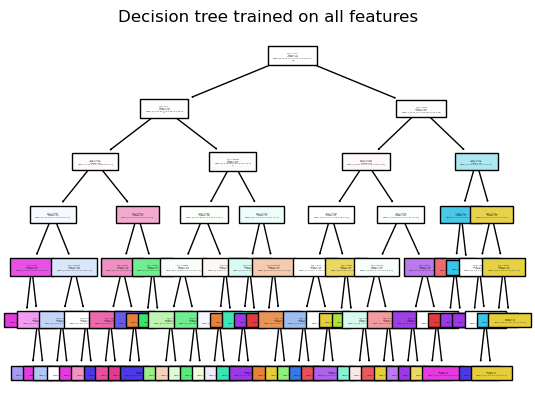

In [95]:
#Decision Tree Plot
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
# reset the configurations to default
plt.rcdefaults()
mpl.rcdefaults()
plt.figure()
clf = DecisionTreeClassifier(criterion='entropy',max_depth = 6, max_features ='auto', random_state =42).fit(X, y)
plot_tree(clf, filled=True,fontsize=1)
plt.title("Decision tree trained on all features")
plt.show()

## Regression

As previous mentioned, According to IBM.

Supervised learning can be separated into two types of problems classification and regression:

When the output label is a numerical value to be predict we are facing a regression problem.

The re are several methods and models available for Regression.

Linear regression is the most commonly used method of predictive analysis. It uses linear relationships between a dependent variable (target) and one or more independent variables (predictors) to predict the future of the target. 

The prediction is based on the assumption that the relationship between the target and the predictors is dependent or causal.

As previous seem some of the scaterplots made suggests that there is a linear regression between some variables wich suggest a Linear Regression model might suits us.

In regards to the data set it is important to mention, as previous discussed this data set contains annual records of each EU country starting from 2002 till 2021.

The subsets of each country only contain 18 observations of each commodity, its quite small number of observations to develop a good Machine Learning Model.

However, is still possible reproduce experiments to test concepts learned in class.

In order to increase the number of observations I am going to cluster 2 countries that have similar patterns and trends using an Unsupervised model Hierarchical clustering and build a Regression model to predict (Bovine) ***Apparent_use_THOUSAND_TONS_CWE*** assuming that all observations belong to the same country.

I am going to make the predictions using a Linear Regression, Linear Regression + Polinomyals.

After that I intend to remove some outliers using `IsolationForest()` and test how much those outliers can compromise the model increasing the errors for the predicted values.

*** IMPORTANT WARNING ! ***

After the data preparation (Including Scalling, Removal of higly correlated variables) while testing the linear regression model It was possible to identify <span style="color:red"> Data Leakage </span>.

After some investigations it was possible to identify the dependent variables could be obtained after a combination of some simples mathematical operations.

***Apparent_use_THOUSAND_TONS_CWE*** = Net_production_tons_THOUSAND_TONS_CWE <span style="color:red"> *minus (-)* </span> 
Meat_exports_Intra_EU_THOUSAND_TONS_CWE <span style="color:red"> *minus (-)* </span>
Meat_exports_Extra_EU_THOUSAND_TONS_CWE <span style="color:blue"> *plus (+)* </span>
Meat_imports_Extra_EU_THOUSAND_TONS_CWE <span style="color:blue"> *plus (+)* </span>
Meat_imports_Intra_EU_THOUSAND_TONS_CWE

For this reason I am going to use only 4 columns for this experiment.

In [96]:
df = df10[df10["Commodity"]=="BOVINE"].drop(["Year"],1)

In [97]:
df = df.filter(["Apparent_use_THOUSAND_TONS_CWE",
                  "Gross_indigenous_production_THOUSAND_TONS_CWE",
                 "Net_production_heads_THOUSAND_EAD","Country"])

In [98]:
df1 = df.groupby('Country').mean()

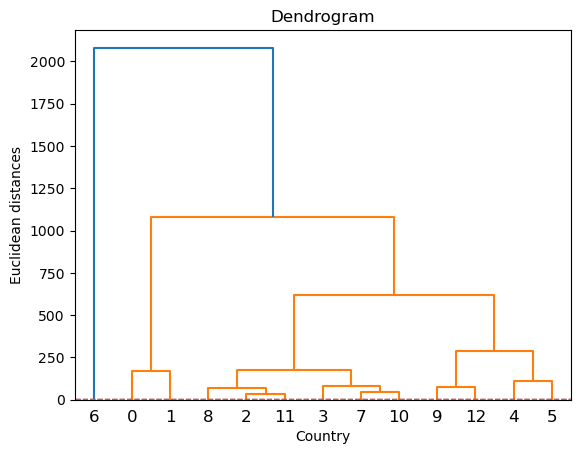

In [99]:
# Using hierarchy to cluster the observations
#Importing scipy.cluster.hierarchy to create dendrogram
import scipy.cluster.hierarchy as sch

dendrogram =sch.dendrogram(sch.linkage(df1,method = 'ward'))

#creating the plot, assigning labels and title
plt.title('Dendrogram')
plt.xlabel('Country')
plt.ylabel('Euclidean distances')

# Add horizontal line to visualize .
plt.axhline(y=3.55, c='red', lw=1, linestyle='dashed')
plt.axhline(y=5.49, c='grey', lw=1, linestyle='dashed')
plt.show()

In [100]:
# Including Cluster Labels
# importing the library 
from sklearn.cluster import AgglomerativeClustering
hierarchy_cluster = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="ward")
#create a pandas series to be used latter on
y1 = pd.Series(hierarchy_cluster.fit_predict(df1), name="Cluster_Hierarquical")

In [101]:
# assigning the Hierarchy cluster labels for each observation in df2
df2 = pd.concat([df1.reset_index(), y1], axis = 1)

In [102]:
# Merging the two datasets using Country as a key and left as a join 
new_df = pd.merge(df, pd.concat([df1.reset_index(), y1], axis = 1)[["Country","Cluster_Hierarquical"]], on="Country", how="left")

In [103]:
# Country label
print(new_df.groupby('Country').max().Cluster_Hierarquical)

Country
Austria      2
Belgium      2
Bulgaria     1
Cyprus       1
Finland      0
Greece       0
Ireland      3
Latvia       1
Lithuania    1
Portugal     0
Slovakia     1
Slovenia     1
Sweden       0
Name: Cluster_Hierarquical, dtype: int64


In [104]:
list_country_2 = new_df[new_df["Cluster_Hierarquical"] == 2]
df = list_country_2.drop(["Country","Cluster_Hierarquical"],1)

In [105]:
df.describe()

,Apparent_use_THOUSAND_TONS_CWE,Gross_indigenous_production_THOUSAND_TONS_CWE,Net_production_heads_THOUSAND_EAD
count,40.000000,40.000000,40.000000
mean,166.855690,237.197502,761.458500
std,22.881750,30.704850,87.300029
min,136.276934,200.902420,644.650000
25%,147.694035,214.945828,684.402500
50%,159.472795,226.633004,737.105000
75%,184.586081,255.355586,835.232500
max,219.420867,333.708701,929.480000


In [106]:
#create_report(df).show()

### Correlation Matrix

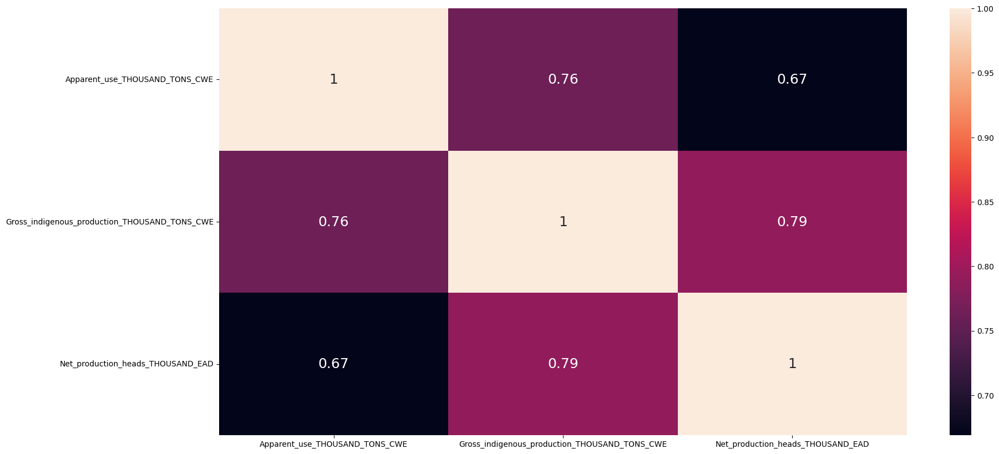

In [107]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(df.corr(),annot = True, annot_kws={'size': 18})
# Labels, title and ticks
plt.show();

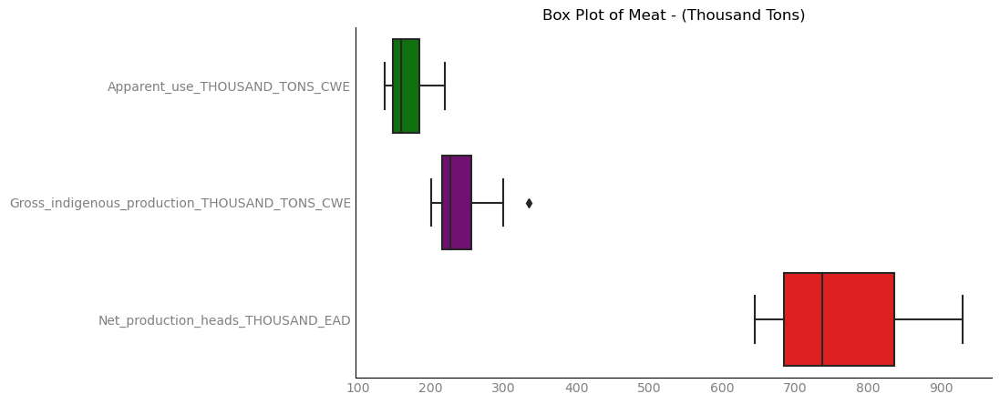

In [108]:
# Box Plot
sns.set_palette(['green', 'purple', 'red'])
plt.figure(figsize=(9, 5))
sns.boxplot(data = df, orient='h').set(title='Box Plot of Meat - (Thousand Tons)')
ax= plt.gca()
ax.tick_params(axis="both", colors="grey", length = 0, labelsize = 10)
plt.xlabel("")
plt.ylabel("")
sns.despine();

### Split dependent and independent variable

In [109]:
# Putting feature variable to X  
X = df.drop(["Apparent_use_THOUSAND_TONS_CWE"],axis=1)
y = df.filter(["Apparent_use_THOUSAND_TONS_CWE"])

### Scaling

Ho: Sample of Bovine is from the normal distributions.(P>0.05)

Ha: Sample of Bovine is not from the normal distributions.

In [110]:
#Shapiro wilk test
from scipy import stats
print(str(stats.shapiro(df.Apparent_use_THOUSAND_TONS_CWE)))

ShapiroResult(statistic=0.9257727861404419, pvalue=0.011751150712370872)


As the data it is not normally distributed MinMaxScale is the best option

In [111]:
# Scaling with MinMaxScale
column_names = list(X.columns)
y_column_name = list(y.columns)


from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
 
df_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y)

df_scaled = pd.DataFrame(df_scaled, columns= column_names)
y_scaled = pd.DataFrame(y_scaled, columns= y_column_name)

print("Scaled Dataset Using MinMaxScaler")
df_scaled.head()

Scaled Dataset Using MinMaxScaler


,Gross_indigenous_production_THOUSAND_TONS_CWE,Net_production_heads_THOUSAND_EAD
0,0.156362,0.219850
1,0.127721,0.141488
2,0.099278,0.103290
3,0.055127,0.033669
4,0.184979,0.133799


### Splitting Data into Training and Test Sets

In [112]:
#from sklearn.model_selection import train_test_split
X = df_scaled
y = y_scaled

In [113]:
# Checking the Shape
X.shape, y.shape

((40, 2), (40, 1))

Using the `train_test_split()`function to split the set of observations into two halves, by selecting a random subset of 70% observations.
Those observations are refer as the training set.

In [114]:
# Splitting the data into train and test using Randon_state 50
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=50)

We then use `LinearRegression()` to fit a linear regression to predict ***Production (THOUSAND TONS)*** from the other features using only the observations corresponding to the training set.

In [115]:
# Importing library and build and fit the model
import sklearn.linear_model as skl_lm
lm = skl_lm.LinearRegression()
model = lm.fit(X_train, y_train)

Using the `predict()` function to estimate the response for the test observations, and `sklearn` to calculate the MSE `(Mean Square error)`.

In [116]:
# Making Predictions
pred = model.predict(X_test)

# Cauculating Mean Square Error
from sklearn.metrics import mean_squared_error
MSE = mean_squared_error(y_test, pred)

print('Mean square error score for this model is:', MSE )

Mean square error score for this model is: 0.06312396540038262


In [117]:
# Inverse the scale to compare Y and Predicted Y
y_reverse = scaler.inverse_transform(y_test).reshape(-1,)
pre_reverse = scaler.inverse_transform(pred).reshape(-1,)

df_comparative = pd.DataFrame(y_reverse,pre_reverse).reset_index()
df_comparative.columns = ['True Value y','Predicted Value y']
df_comparative.head(10)

,True Value y,Predicted Value y
0,146.865119,168.563274
1,153.638024,147.146140
2,179.521266,165.372058
3,151.518756,171.562753
4,167.235937,189.113740
5,153.719113,138.440826
6,181.976921,201.989210
7,162.677716,182.106025
8,147.517984,154.379821
9,147.317170,137.259827


In [118]:
# Calculating Mape
def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100
print("The predictive Values are ""%.2f%%" % mape(y_reverse, pre_reverse) +" distant from the true values")

The predictive Values are 10.19% distant from the true values


Therefore, the estimated test MSE for the linear regression fit is 0.0631.\
We can use the `PolynomialFeatures()` function to estimate the test error for the polynomial quadratic and cubic regressions.

In [119]:
# Adding Polynomials
from sklearn.preprocessing import PolynomialFeatures
# Linear
model = lm.fit(X_train, y_train)
print('Mean square error score for Linear model is:',mean_squared_error(y_test, model.predict(X_test)))

# Quadratic
poly = PolynomialFeatures(degree=2)
X_train2 = poly.fit_transform(X_train)
X_test2 = poly.fit_transform(X_test)

model = lm.fit(X_train2, y_train)
print('Mean square error score for quadratic model is:',mean_squared_error(y_test, model.predict(X_test2)))

# Cubic
poly = PolynomialFeatures(degree=3)
X_train3 = poly.fit_transform(X_train)
X_test3 = poly.fit_transform(X_test)

model = lm.fit(X_train3, y_train)
print('Mean square error score for cubic model is:',mean_squared_error(y_test, model.predict(X_test3)))


Mean square error score for Linear model is: 0.06312396540038262
Mean square error score for quadratic model is: 0.046378841008406835
Mean square error score for cubic model is: 0.03572525398251313


These error rates are 0.04637 (quadratic) and 0.03572 (cubic), respectively, an improvement was observed, however , another issues is that just by choosing a different training set instead, we will obtain different errors on the validation set. 
This could demonstrated by setting a different random seed for example.

Another question would be : Is it the Cubic polynomial the best one for this problem ?

This procedure can be repeated for increasingly complex polynomial fits.

To automate the process, we use the `for()` function to initiate a for loop which iteratively fits polynomial regressions for polynomials of order `i = 1` to `i = 5` and computes the associated 20 Folds cross-validation error using X and y to eliminate the training test random effect allowing the model to use all observations for training and test.

In [120]:
# Adding Polynomial
from sklearn.preprocessing import PolynomialFeatures
for i in range(1,6):
    poly = PolynomialFeatures(degree=i)
    X_current = poly.fit_transform(X)
    model = lm.fit(X_current, y)
    scores = cross_val_score(model, X_current, y, scoring="neg_mean_squared_error", cv = 40, n_jobs=1)
    
    print("Degree-"+str(i)+" polynomial MSE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))
    

Degree-1 polynomial MSE: 0.03853144790183812, STD: 0.054673294935521304
Degree-2 polynomial MSE: 0.023508100768398727, STD: 0.03505284046272261
Degree-3 polynomial MSE: 0.02899090773131744, STD: 0.061324146762295306
Degree-4 polynomial MSE: 2.598131331182647, STD: 15.47526936420165
Degree-5 polynomial MSE: 72.40919964377538, STD: 434.63681897310533


The above output confirmed a drop in the estimated test MSE between the simple regression with 1 Polynomial and the quadratic fits, but then no improvement from using higher-order polynomials was observed, adding complexity the models starts to perform poorly.

### Removing Outliers

Linear Regretions are highly aftected by outilers.

I am going to test this hypotese using an Isolation Forest.

According to Data Sciance Word 

Isolation Forest (iForest) is a machine learning algorithm for anomaly detection. 
Instances, which have an average shorter path length in the trained isolation forest, are classified as anomalous points.

The isolation Forest algorithm is a very effective and intuitive anomaly detection method, which was first proposed by Fei Tony Liu, Kai Ming Ting, and Zhi-Hua Zhou in 2008. (F. T. Liu, K. M. Ting, and Z.-H. Zhou. 

Isolation forest. In Proceedings of the IEEE International Conference on Data Mining, pages 413–422, 2008.)

I am going to apply agrid search to optimise the hyper parameters using the below code.

In [121]:
from sklearn.ensemble import IsolationForest
from sklearn import model_selection
model = IsolationForest(random_state=47)
X = pd.DataFrame(X).values.reshape(-1,2)
y = pd.DataFrame(y).values.reshape(-1,1)

param_grid = {'n_estimators': [200,400], 
              'max_samples': [10,20], 
              'contamination': [0.10], 
              'max_features': [1,2], 
              'bootstrap': [True], 
              'n_jobs': [-1]}

grid_search = model_selection.GridSearchCV(model, 
                                           param_grid,
                                           scoring="neg_mean_squared_error", 
                                           refit=True,
                                           cv=5, 
                                           return_train_score=True)
grid_search.fit(X, y)

best_model = grid_search.fit(X, y)
print('Optimum parameters', best_model.best_params_)

Optimum parameters {'bootstrap': True, 'contamination': 0.1, 'max_features': 2, 'max_samples': 20, 'n_estimators': 200, 'n_jobs': -1}


The most important hyperparameter is the Contamination.

It is important to mention that Isolated Forest does not evaluate the outliers into each variable, it takes an complet approach classifican the observation as an outiler or not. 

For this exercise using the optimum parameters I am going to allow the Isolation Forest to detect 10% of my observations that can be considered outilers. 

I am going to exclude the observations considered outilers to evaluate the impact on my predictions.

In [122]:
# Applying IsolationForest with best hyperparameters

out_IF = IsolationForest(bootstrap = True, contamination= 0.10, 
                         max_features = 1, max_samples= 20, 
                         n_estimators= 200, n_jobs= 1,random_state=42).fit_predict(X)

outliers   = X[out_IF != 1, :]
X_w_out    = X[out_IF == 1, :]
y_w_out    = y[out_IF == 1, :]

print("Number of outiler: %i"% outliers.shape[0])
print("Number of X observations less outiler: %i"% X_w_out.shape[0])
print("Number of y observations less outiler: %i"% y_w_out.shape[0])

Number of outiler: 4
Number of X observations less outiler: 36
Number of y observations less outiler: 36


In [123]:
# Retraining the model with Cross Valisation Leave One Out
from sklearn.model_selection import LeaveOneOut
loo = LeaveOneOut()
X = X_w_out
y = y_w_out
loo.get_n_splits(X)

model = lm.fit(X,y)

from sklearn.model_selection import KFold

crossvalidation = KFold(n_splits=36, random_state=None, shuffle=False)

scores = cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=crossvalidation, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MSE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Folds: 36, MSE: 0.03498538730885042, STD: 0.0515784451980843


In [124]:
from sklearn.preprocessing import PolynomialFeatures
for i in range(1,6):
    poly = PolynomialFeatures(degree=i)
    X_current = poly.fit_transform(X)
    model = lm.fit(X_current, y)
    scores = cross_val_score(model, X_current, y, scoring="neg_mean_squared_error", cv=crossvalidation, n_jobs=1)
    
    print("Degree-"+str(i)+" polynomial MSE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Degree-1 polynomial MSE: 0.0349853873088504, STD: 0.05157844519808431
Degree-2 polynomial MSE: 0.027978593257003057, STD: 0.04567531159378421
Degree-3 polynomial MSE: 0.036763924836630796, STD: 0.06942665497998875
Degree-4 polynomial MSE: 0.3329652792502227, STD: 1.2104291211155622
Degree-5 polynomial MSE: 77.76410987620493, STD: 352.9314354256038


In [125]:
# Quadratic
poly = PolynomialFeatures(degree=2)
X_quad= poly.fit_transform(X)
model = lm.fit(X_quad, y)

In [126]:
pred = model.predict(X_quad)

from sklearn.metrics import mean_absolute_percentage_error
MSE = mean_squared_error(y, pred)
print('Mean square error score for this model is:', MSE)

Mean square error score for this model is: 0.015134322731066022


In [127]:
print(mean_absolute_percentage_error(y, pred))

15707850426028.549


In [128]:
y_reverse = scaler.inverse_transform(y).reshape(-1,)
pre_reverse = scaler.inverse_transform(pred).reshape(-1,)

In [129]:
y_reverse = scaler.inverse_transform(y).reshape(-1,)
pre_reverse = scaler.inverse_transform(pred).reshape(-1,)

df_comparative_wo_out = pd.DataFrame(y_reverse,pre_reverse).reset_index()
df_comparative_wo_out.columns = ['True Value y','Predicted Value y']
df_comparative_wo_out.head(10)

,True Value y,Predicted Value y
0,160.421776,150.230876
1,151.902926,147.146140
2,146.716683,136.276934
3,136.513496,143.325801
4,153.327085,149.743905
5,151.478279,153.523450
6,158.345813,153.131545
7,156.811942,147.834754
8,158.341771,138.440826
9,153.569544,140.328811


In [130]:
# Calculating Mape
def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100
print("The predictive Values are ""%.2f%%" % mape(y_reverse, pre_reverse) +" distant from the true values")

The predictive Values are 5.45% distant from the true values


## Sentimental Analises

Text availeble at :

https://www.irishtimes.com/news/inflation-warning-to-dairy-farmers-1.1102087

In [131]:
# Tokenizing the text
from nltk.tokenize import sent_tokenize
text="""Dairy farmers have been warned that inflation could affect them more than any other sector in the next few years.

At the IFA dairy conference in Portlaoise yesterday, Mr Martin Varley, policy development director with the Irish Co-operative Organisation Society, warned farmers that inflation would hit them in three ways.

He said dairy farmers would be affected by higher input costs, increased processing costs, and reduced purchasing power, because of increased living costs.

Mr Varley compared a basket of prices between 1990 and 2000. He said that while the price of cattle fell by 5.5 per cent over that time, motor fuel costs rose by over 40 per cent while veterinary and artificial insemination fees rose by 36 per cent.

He called on the Government to act quickly to control inflation. Mr Varley said investment incentives should be provided for dairy farmers to encourage them to increase the size of their enterprises, thus increasing their viability.

He said farmers should take responsibility for their futures by limiting their on-farm costs, improving their production methods and increasing protein levels. He said it was vital to take this action now, and not in five years' time when the effects of inflation would have already hit.

Several farmers in the profitable dairy sector told the gathering that they could see no reason for their children to continue farming. One farmer said there were only two farmers aged under 25 in his area of Sligo.

Mr Padraig Mulligan of Templeboy, Co Sligo, said farmers had worked to implement farm plans and to increase their enterprise, yet their standard of living was the same as 10 years ago. He said farmers felt they were reaping no rewards for their work.

Meanwhile, the IFA president, Mr Tom Parlon, claimed that dairy processors were not passing on recent price increases to farmers.He said Irish processors had enjoyed "massive increases in returns" in recent months but farmers were not getting the benefit of the buoyant market.

Processors, he said, were getting an average increase of 12.4 pence per gallon in skim milk powder/butter returns, compared with last year's price. Yet co-operatives had increased prices only by 3p to 4.5p per gallon between May and July.

Irish farmers got a taste of militant French tactics when they were addressed by Mr Philippe Jachnik, who represents a group of French dairy processors. Mr Jachnik told the gathering that French farmers regularly carry out thousands of organised spot checks on pricing in supermarkets and hypermarkets around the country.

This worked to rectify any "exaggerations" in pricing. He said that if farmers were unhappy with a supermarket's policy, they would not cause destruction but would create such a mess that the supermarket would be more inclined to negotiate with them."""
tokenized_text=sent_tokenize(text)
print(tokenized_text)

['Dairy farmers have been warned that inflation could affect them more than any other sector in the next few years.', 'At the IFA dairy conference in Portlaoise yesterday, Mr Martin Varley, policy development director with the Irish Co-operative Organisation Society, warned farmers that inflation would hit them in three ways.', 'He said dairy farmers would be affected by higher input costs, increased processing costs, and reduced purchasing power, because of increased living costs.', 'Mr Varley compared a basket of prices between 1990 and 2000.', 'He said that while the price of cattle fell by 5.5 per cent over that time, motor fuel costs rose by over 40 per cent while veterinary and artificial insemination fees rose by 36 per cent.', 'He called on the Government to act quickly to control inflation.', 'Mr Varley said investment incentives should be provided for dairy farmers to encourage them to increase the size of their enterprises, thus increasing their viability.', 'He said farmers

In [132]:
#printing the words tokenized
from nltk.tokenize import word_tokenize
tokenized_word=word_tokenize(text)
tokenized_sent = tokenized_word
print(tokenized_word)

['Dairy', 'farmers', 'have', 'been', 'warned', 'that', 'inflation', 'could', 'affect', 'them', 'more', 'than', 'any', 'other', 'sector', 'in', 'the', 'next', 'few', 'years', '.', 'At', 'the', 'IFA', 'dairy', 'conference', 'in', 'Portlaoise', 'yesterday', ',', 'Mr', 'Martin', 'Varley', ',', 'policy', 'development', 'director', 'with', 'the', 'Irish', 'Co-operative', 'Organisation', 'Society', ',', 'warned', 'farmers', 'that', 'inflation', 'would', 'hit', 'them', 'in', 'three', 'ways', '.', 'He', 'said', 'dairy', 'farmers', 'would', 'be', 'affected', 'by', 'higher', 'input', 'costs', ',', 'increased', 'processing', 'costs', ',', 'and', 'reduced', 'purchasing', 'power', ',', 'because', 'of', 'increased', 'living', 'costs', '.', 'Mr', 'Varley', 'compared', 'a', 'basket', 'of', 'prices', 'between', '1990', 'and', '2000', '.', 'He', 'said', 'that', 'while', 'the', 'price', 'of', 'cattle', 'fell', 'by', '5.5', 'per', 'cent', 'over', 'that', 'time', ',', 'motor', 'fuel', 'costs', 'rose', 'by',

In [133]:
from nltk.probability import FreqDist
fdist = FreqDist(tokenized_word)
print(fdist)

<FreqDist with 246 samples and 506 outcomes>


In [134]:
fdist.most_common(2)

[(',', 21), ('.', 20)]

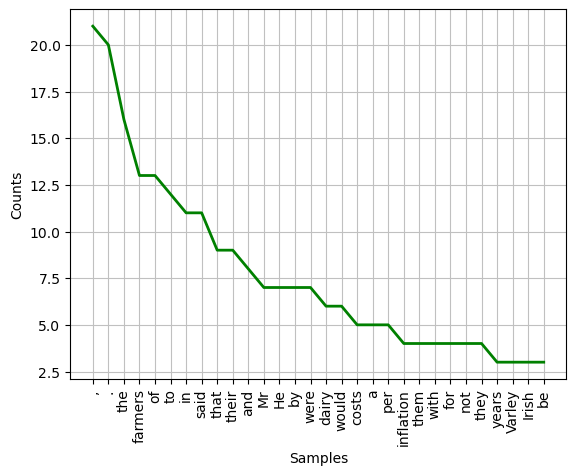

In [135]:
# Frequency Distribution Plot
import matplotlib.pyplot as plt
fdist.plot(30,cumulative=False)
plt.show()

In [136]:
from nltk.corpus import stopwords
stop_words=set(stopwords.words("english"))

In [137]:
# Removing stop words
filtered_sent=[]
for w in tokenized_sent:
    if w not in stop_words:
        filtered_sent.append(w)
print("Filterd Sentence:",filtered_sent)

Filterd Sentence: ['Dairy', 'farmers', 'warned', 'inflation', 'could', 'affect', 'sector', 'next', 'years', '.', 'At', 'IFA', 'dairy', 'conference', 'Portlaoise', 'yesterday', ',', 'Mr', 'Martin', 'Varley', ',', 'policy', 'development', 'director', 'Irish', 'Co-operative', 'Organisation', 'Society', ',', 'warned', 'farmers', 'inflation', 'would', 'hit', 'three', 'ways', '.', 'He', 'said', 'dairy', 'farmers', 'would', 'affected', 'higher', 'input', 'costs', ',', 'increased', 'processing', 'costs', ',', 'reduced', 'purchasing', 'power', ',', 'increased', 'living', 'costs', '.', 'Mr', 'Varley', 'compared', 'basket', 'prices', '1990', '2000', '.', 'He', 'said', 'price', 'cattle', 'fell', '5.5', 'per', 'cent', 'time', ',', 'motor', 'fuel', 'costs', 'rose', '40', 'per', 'cent', 'veterinary', 'artificial', 'insemination', 'fees', 'rose', '36', 'per', 'cent', '.', 'He', 'called', 'Government', 'act', 'quickly', 'control', 'inflation', '.', 'Mr', 'Varley', 'said', 'investment', 'incentives', 'p

In [138]:
# Creating a dictionary with Positive, Negative and Neutral words
positive_vocab = [ 'happy','awesome', 'outstanding', 'fantastic', 'terrific', 'good', 'nice', 'great', ':)','positive','respectful' ]
negative_vocab = [ 'bad','unhappy','dishonest','inflation','' 'banned', 'terrible','useless','hide','warned','concern', 'hate','pricing', ':(','court','lawyer','negative','scamming','disrespectful','cost']
neutral_vocab = [ 'movie','the','sound','was','is','actors','did','know','words','not','money','order', ]

In [139]:
def word_feats(words):
    return dict([(word, True) for word in words])
 
positive_features = [(word_feats(pos), 'pos') for pos in positive_vocab]
negative_features = [(word_feats(neg), 'neg') for neg in negative_vocab]
neutral_features = [(word_feats(neu), 'neu') for neu in neutral_vocab]

In [140]:
train_set = negative_features + positive_features + neutral_features

In [141]:
from nltk.classify import NaiveBayesClassifier
classifier = NaiveBayesClassifier.train(train_set)

In [142]:
texts = str(filtered_sent)

In [143]:
# Importing the classifier
import nltk.classify.util
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import names
# Predict
neg = 0
pos = 0
sentence = texts
sentence = sentence.lower()
words = sentence.split(' ')
for word in words:
    classResult = classifier.classify( word_feats(word))
    if classResult == 'neg':
        neg = neg + 1
    if classResult == 'pos':
        pos = pos + 1
 
print('Positive: ' + str(float(pos)/len(words)))
print('Negative: ' + str(float(neg)/len(words)))

Positive: 0.2314540059347181
Negative: 0.7151335311572701


In [144]:
# Import library
import math
from textblob import TextBlob as tb
def tf(word, blob):
    return blob.words.count(word) / len(blob.words)
def n_containing(word, bloblist):
    return sum(1 for blob in bloblist if word in blob.words)
def idf(word, bloblist):
    return math.log(len(bloblist) / (1 + n_containing(word, bloblist)))
def tfidf(word, blob, bloblist):
    return tf(word, blob) * idf(word, bloblist)
document1 = tb("""Dairy farmers have been warned that inflation could affect them more than any other sector in the next few years.

At the IFA dairy conference in Portlaoise yesterday, Mr Martin Varley, policy development director with the Irish Co-operative Organisation Society, warned farmers that inflation would hit them in three ways.

He said dairy farmers would be affected by higher input costs, increased processing costs, and reduced purchasing power, because of increased living costs.

Mr Varley compared a basket of prices between 1990 and 2000. He said that while the price of cattle fell by 5.5 per cent over that time, motor fuel costs rose by over 40 per cent while veterinary and artificial insemination fees rose by 36 per cent.

He called on the Government to act quickly to control inflation. Mr Varley said investment incentives should be provided for dairy farmers to encourage them to increase the size of their enterprises, thus increasing their viability.

He said farmers should take responsibility for their futures by limiting their on-farm costs, improving their production methods and increasing protein levels. He said it was vital to take this action now, and not in five years' time when the effects of inflation would have already hit.

Several farmers in the profitable dairy sector told the gathering that they could see no reason for their children to continue farming. One farmer said there were only two farmers aged under 25 in his area of Sligo.

Mr Padraig Mulligan of Templeboy, Co Sligo, said farmers had worked to implement farm plans and to increase their enterprise, yet their standard of living was the same as 10 years ago. He said farmers felt they were reaping no rewards for their work.

Meanwhile, the IFA president, Mr Tom Parlon, claimed that dairy processors were not passing on recent price increases to farmers.He said Irish processors had enjoyed "massive increases in returns" in recent months but farmers were not getting the benefit of the buoyant market.

Processors, he said, were getting an average increase of 12.4 pence per gallon in skim milk powder/butter returns, compared with last year's price. Yet co-operatives had increased prices only by 3p to 4.5p per gallon between May and July.

Irish farmers got a taste of militant French tactics when they were addressed by Mr Philippe Jachnik, who represents a group of French dairy processors. Mr Jachnik told the gathering that French farmers regularly carry out thousands of organised spot checks on pricing in supermarkets and hypermarkets around the country.

This worked to rectify any "exaggerations" in pricing. He said that if farmers were unhappy with a supermarket's policy, they would not cause destruction but would create such a mess that the supermarket would be more inclined to negotiate with them.""")
bloblist = [document1]
for i, blob in enumerate(bloblist):
    print("Top words in document {}".format(i + 1))
    scores = {word: tfidf(word, blob, bloblist) for word in blob.words}
    sorted_words = sorted(scores.items(), key=lambda x: x[1], reverse=True)
    for word, score in sorted_words[:3]:
        print("\tWord: {}, TF-IDF: {}".format(word, round(score, 5)))

Top words in document 1
	Word: been, TF-IDF: -0.00151
	Word: affect, TF-IDF: -0.00151
	Word: than, TF-IDF: -0.00151


## References:

Agriland.ie. (2018). Over 70% of the total supply of meat in Ireland was exported in 2017. [online] Available at: https://www.agriland.ie/farming-news/over-70-of-the-total-supply-of-meat-in-ireland-was-exported-in-2017

Chartio. (n.d.). A Complete Guide to Box Plots. [online] Available at: https://chartio.com/learn/charts/box-plot-complete-guide/#:~:text=Box%20plots%20are%20used%20to%20show%20distributions%20of


Chartio. (n.d.). A Complete Guide to Violin Plots. [online] Available at: https://chartio.com/learn/charts/violin-plot-complete-guide/.

Cross Validated. (n.d.). data visualization - Visualising the variance. [online] Available at: https://stats.stackexchange.com/questions/72208/visualising-the-variance

Data Science World. (2021). What is Isolation Forest? [online] Available at: https://dsworld.org/what-is-an-isolation-forest/

data.europa.eu. (n.d.). data.europa.eu. [online] Available at: https://data.europa.eu/data/datasets/33243e5e-44a1-4b43-9444-31d64dc7921f?locale=en

data.europa.eu. (n.d.). Open data in the agricultural sector | data.europa.eu. [online] Available at: https://data.europa.eu/en/datastories/open-data-agricultural-sector?msclkid=50919ccfc3b811ecbb40ff9017a09bbd

Department of Agriculture, F. & the M. (n.d.). Market Access: Meat. [online] www.marketaccess.agriculture.gov.ie. Available at: http://www.marketaccess.agriculture.gov.ie/meat/.

docs.scipy.org. (n.d.). Statistics (scipy.stats) — SciPy v1.8.0 Manual. [online] Available at: https://docs.scipy.org/doc/scipy/tutorial/stats.html.

explore.mathworks.com. (n.d.). Choosing the Best Machine Learning Classification Model and Avoiding Overfitting. [online] Available at: https://explore.mathworks.com/common-machine-learning-challenges.

GeeksforGeeks. (2022a). How to Perform a Shapiro-Wilk Test in Python. [online] Available at: https://www.geeksforgeeks.org/how-to-perform-a-shapiro-wilk-test-in-python/

GeeksforGeeks. (2022b). How to Perform Bartlett’s Test in Python? [online] Available at: https://www.geeksforgeeks.org/how-to-perform-bartletts-test-in-python/#:~:text=In%20python%20Bartlett%E2%80%99s%20test%20is%20performed%20by
.
Getemoji.com. (2019). Get Emoji — All Emojis to Copy and Paste. [online] Available at: https://getemoji.com/.

GODAN. (n.d.). Agriculture. [online] Available at: https://www.godan.info/pages/agriculture

Healy, A. (n.d.). Inflation warning to dairy farmers. [online] The Irish Times. Available at: https://www.irishtimes.com/news/inflation-warning-to-dairy-farmers-1.1102087.

IBM (2020). What is Supervised Learning? [online] www.ibm.com. Available at: https://www.ibm.com/cloud/learn/supervised-learning.

IMPROVING AGRICULTURE, FOOD AND NUTRITION WITH OPEN DATA. (2014). [online] Available at: https://www.godan.info/sites/default/files/GODAN%27s%20Impacts%202014%20to%202018%20-%20Improving%20Agriculture%2C%20Food%20and%20Nutrition%20with%20Open%20Data%20_0.pdf

Lewinson, E. (2021). Outlier Detection with Isolation Forest. [online] Medium. Available at: https://towardsdatascience.com/outlier-detection-with-isolation-forest-3d190448d45e#:~:text=Isolation%20Forest%20is%20an%20outlier%20detection%20technique%20that

Loria, S. (n.d.). textblob: Simple, Pythonic text processing. Sentiment analysis, part-of-speech tagging, noun phrase parsing, and more. [online] PyPI. Available at: https://pypi.org/project/textblob/.

Lowder, S.K., Skoet, J. and Raney, T. (2022). The Number, Size, and Distribution of Farms, Smallholder Farms, and Family Farms Worldwide. World Development, 87, pp.16–29. doi:10.1016/j.worlddev.2015.10.041.

Marsja, E. (2021). How to Make a Violin plot in Python using Matplotlib and Seaborn. [online] Erik Marsja. Available at: https://www.marsja.se/how-to-make-a-violin-plot-in-python-using-matplotlib-and-seaborn/#:~:text=Here%E2%80%99s%20how%20to%20create%20a%20violin%20plot%20with

Naskar, A. (2019). Natural Language Processing Using TextBlob. [online] ThinkInfi. Available at: https://thinkinfi.com/natural-language-processing-using-textblob/

plotly.com. (n.d.). Ml. [online] Available at: https://plotly.com/python/ml-regression/#displaying-polynomialfeatures-using-latex.

practicaldatascience.co.uk. (2021). How to use the Isolation Forest model for outlier detection. [online] Available at: https://practicaldatascience.co.uk/machine-learning/how-to-use-the-isolation-forest-model-for-outlier-detection

Rai, S. (2019). Have fun with Emojis in Jupyter Notebook. [online] Medium. Available at: https://sawanrai777.medium.com/have-fun-with-emojis-in-jupyter-notebook-f74db7f45210

Ritchie, H. and Roser, M. (2021). Farm Size. Our World in Data. [online] Available at: https://ourworldindata.org/farm-size?msclkid=f21ba95cc87011ec8204715d36d418ee#distribution-of-farm-sizes-across-the-world

Salles, R. (2018). Outlier: o ponto fora da curva. [online] Ensina.AI. Available at: https://medium.com/ensina-ai/outlier-o-ponto-fora-da-curva-1f28f3d9c23#:~:text=Regress%C3%A3o%20linear%20%C3%A9%20um%20algoritmo%20reconhecidamente%20sens%C3%ADvel%20aos

Singh, S. (2020). Categorical Variable Encoding Techniques. [online] Analytics Vidhya. Available at: https://medium.com/analytics-vidhya/categorical-variable-encoding-techniques-17e607fe42f9#:~:text=If%20the%20relationship%20between%20any%20categorical%20column%20as

Stack Overflow. (n.d.). Confusion Matrix for Multiple Classes in Python. [online] Available at: https://stackoverflow.com/questions/65618137/confusion-matrix-for-multiple-classes-in-python

Stack Overflow. (n.d.). How to apply color in Markdown? [online] Available at: https://stackoverflow.com/questions/35465557/how-to-apply-color-in-markdown

vitornotaro (2022). CA2_CCT_Vitor_Notaro. [online] GitHub. Available at: https://github.com/vitornotaro/CA2_CCT_Vitor_Notaro

www.bing.com. (n.d.). how to interpret confusion matrix multilabel - Bing video. [online] Available at: https://www.bing.com/videos/search?q=how+to+interpret+confusion+matrix+multilabel&docid=608045521210255103&mid=67D02AA98433EECA6ABA67D02AA98433EECA6ABA&view=detail&FORM=VIRE

www.cso.ie. (n.d.). European Comparison - CSO - Central Statistics Office. [online] Available at: https://www.cso.ie/en/releasesandpublications/ep/p-fss/farmstructuresurvey2013/europeancomparison/

www.europenowjournal.org. (n.d.). The Common Agricultural Policy: An Overview. [online] Available at: https://www.europenowjournal.org/2020/11/09/the-common-agricultural-policy-an-overview/#:~:text=The%20Common%20Agricultural%20Policy%3A%20An%20Overview%20%20

www.ibm.com. (n.d.). About Linear Regression | IBM. [online] Available at: https://www.ibm.com/topics/linear-regression.

www.ibm.com. (n.d.). linear regression. [online] Available at: https://www.ibm.com/docs/en/db2-warehouse?topic=procedures-linear-regression.

www.pythonclass.in. (n.d.). labelencoder sklearn | labelencoder scikit. [online] Available at: https://www.pythonclass.in/labelencoder-sklearn.php#:~:text=The%20fit_transform%20method%20in%20the%20labelEncoder%20will%20follow

www.science.smith.edu. (n.d.). Lab 7 - Cross-Validation in Python. [online] Available at: http://www.science.smith.edu/~jcrouser/SDS293/labs/lab7-py.html

Yıldırım, S. (2020). Data Leakage in Machine Learning. [online] Medium. Available at: https://towardsdatascience.com/data-leakage-in-machine-learning-6161c167e8ba.

Zach (2020a). How to Perform a Kruskal-Wallis Test in Python. [online] Statology. Available at: https://www.statology.org/kruskal-wallis-test-python/#:~:text=Example%3A%20Kruskal-Wallis%20Test%20in%20Python%20Researchers%20want%20to

Zach (2020b). How to Perform a One Proportion Z-Test in Python. [online] Statology. Available at: https://www.statology.org/one-proportion-z-test-python/#:~:text=To%20perform%20a%20one%20proportion%20z-test%20in%20Python%2C


